<p style="font-size:30px; color:red; font-weight:bold; font-style:italic;"> Case Study 2: Real Estate Image Classification using Deep Learning</p>

<p style="font-size:25px; color:black; font-weight:bold; font-style:italic;">Table of contents</p>

<p style="font-size:17px; color:green; font-style:italic;">8.&ensp;Loading and spliting image paths</p>
<p style="font-size:17px; color:green; font-style:italic;">9.&ensp;Data generator</p>
<p style="font-size:17px; color:green; font-style:italic;">10.&ensp;Modeling</p>
<ol>
    <li style="font-size:15px; color:blue; font-style:italic;">&ensp; Bse Model: CNN based model </li>
    <li style="font-size:15px; color:blue; font-style:italic;">&ensp; Pretrained VGG16 based model</li>
    <li style="font-size:15px; color:blue; font-style:italic;">&ensp; Pretrained VGG19 based model</li>
    <li style="font-size:15px; color:blue; font-style:italic;">&ensp; Pretrained ResNet50 based model</li>
    <li style="font-size:15px; color:blue; font-style:italic;">&ensp; Pretrained ResNet152 based model</li>
    <li style="font-size:15px; color:blue; font-style:italic;">&ensp; Pretrained InceptioV3 based model</li>
    <li style="font-size:15px; color:blue; font-style:italic;">&ensp; Pretrained EfficientNetB0 based model</li>
</ol>
<p style="font-size:17px; color:green; font-style:italic;">11.&ensp;Summary of all the models with their respective scores</p>

<p style="font-size:17px; color:green; font-style:italic;">12.&ensp;Saving encoder vectorizer and class label list</p>

<p style="font-size:17px; color:green; font-style:italic;">12.&ensp;Error Analysis on the best performing model: EfficientNetB0</p>

<p style="font-size:25px; color:balck; font-weight:bold; font-style:italic;">8.&ensp;Loading and spliting image paths</p>

<p style="font-size:17px; color:green; font-style:italic; ">In this section, I will load images data paths with respected labels into a pandas dataframe and split them into train and test images path.</p>


* <p style="font-size:14px; color:blue; font-style:italic; ">Importing modules</p>

In [1]:
import os
import numpy as np
import pandas as pd
import cv2 as cv
import tensorflow as tf

from tqdm.notebook import tqdm
from warnings import filterwarnings
filterwarnings('ignore')
import gc

from sklearn.model_selection import train_test_split

In [2]:
### Defining SEED value and the root path
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)
ROOT_DIR = "E:/case study 2/REI/data/"

* <p style="font-size:14px; color:blue; font-style:italic; ">Loading images paths and respected images class labels in dataframe</p>

In [3]:
df_paths = pd.read_csv("df_contains_path.csv")
df_paths = df_paths.sample(frac=1)
df_paths.shape

(5859, 2)

* <p style="font-size:14px; color:blue; font-style:italic; ">Spliting image paths and respected labels into train and test set</p>

In [4]:
train, val = train_test_split(df_paths, test_size=0.15, stratify=df_paths['labels'])

In [5]:
print(f"Shape of train data: {train.shape}")
print(f"Shape of val data: {val.shape}")

Shape of train data: (4980, 2)
Shape of val data: (879, 2)


* <p style="font-size:14px; color:blue; font-style:italic; ">Saving train and test path to the disk, so that we can use them in future without data leakage</p>

In [6]:
# saving train and validation data set to disk in csv format
train.to_csv('train_set.csv', index=False)
val.to_csv('val_set.csv', index=False)

* <p style="font-size:14px; color:blue; font-style:italic; ">Let's check the class labels distribution throughout the train and test data</p>

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

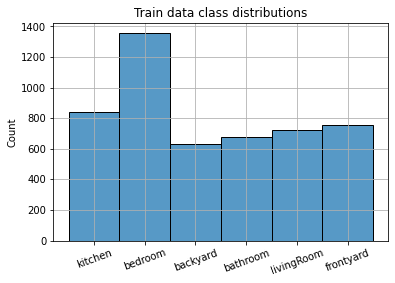

In [8]:
# plot train class labels distribution using histogram
sns.histplot(train['labels'])
# setting xlables as space
plt.xlabel('')
# setting title to the plot
plt.title('Train data class distributions')
# rotating x ticks
plt.xticks(rotation=20)
# apply grid to the plot
plt.grid()
plt.show()

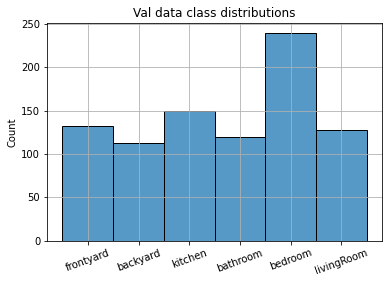

In [9]:
# plot val class labels distribution using histogram
sns.histplot(val['labels'])
# setting xlables as space
plt.xlabel('')
# setting title to the plot
plt.title('Val data class distributions')
# rotating x ticks
plt.xticks(rotation=20)
# apply grid to the plot
plt.grid()
plt.show()

* <p style="font-size:14px; color:blue; font-style:italic; ">Storing images class labels in the list, to use further in code</p>

In [10]:
### getting list of all the class labels that are present in the dataset
class_list = os.listdir(ROOT_DIR)
print(f"Class labels: {class_list}")

Class labels: ['backyard', 'bathroom', 'bedroom', 'frontyard', 'kitchen', 'livingRoom']


* <p style="font-size:14px; color:blue; font-style:italic; ">Defining function to convert categorical features into discrete numbers</p>

In [11]:
def to_numerical(x):
    """this function will return the index of class list after seeing the x in it"""
    return class_list.index(x)

# converting categorical labels into its respected continous numerical dicrete value for train and val
train['labels'] = train['labels'].apply(to_numerical)
val['labels'] = val['labels'].apply(to_numerical)

* <p style="font-size:14px; color:blue; font-style:italic; ">One hot encoding discrete class labels</p>

In [12]:
# module to encode class labels into one hot encoded fashion
from sklearn.preprocessing import OneHotEncoder
# initialising one hot encoder object
ohe = OneHotEncoder(sparse=False)
# fitting and transforming train labels into one hot encoding
y_train = ohe.fit_transform(np.array(train['labels']).reshape(-1,1))
# transoforming train labels into one hot encoding
y_val = ohe.transform(np.array(val['labels']).reshape(-1,1))
# showing y_train after one hot encoding
y_train

array([[0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0.],
       ...,
       [0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1., 0.]])

<p style='font-size:15px; color:green; font-style:italic;'>From the above plot we can see the labels are distributed uniformaly</p>

<p style="font-size:25px; color:balck; font-weight:bold; font-style:italic;">9.&ensp;Data generator</p>

<p style="font-size:17px; color:green; font-style:italic; ">The goal of the data generator is to load image data from disk into memory in batches.</p>

<p style="font-size:17px; color:green; font-style:italic; ">Loading data into memory in batches avoids system crash due to low memory issue.</p>


* <p style="font-size:14px; color:blue; font-style:italic; ">Declaring constants to use further in notebook</p>

In [13]:
# Declaring some constant that will be use through out the notebook,
# except BATCH_SIZE it will be change as per need
# batch size
BATCH_SIZE = 16
# epochs
EPOCHS = 50
# image width and height
W,H = 224,224
# image final/target shape
TARGET_SHAPE = (W,H)
# image input shape to feed in model
INPUT_SHAPE = (W,H,3)

* <p style="font-size:14px; color:blue; font-style:italic; ">Defining CLAHE image enhancing function</p>

In [14]:
# source: https://ogeek.cn/qa/?qa=903624/
def get_enhanced_image(img, clipLimit=2, tileGridSize=(8,8)):
    """tis function will return enhanced image"""
    # converting image color channel
    lab = cv.cvtColor(img, cv.COLOR_BGR2LAB)
    # spliting image channel wise
    lab_planes = cv.split(lab)
    # Createing clahe object 
    clahe = cv.createCLAHE(clipLimit=clipLimit,tileGridSize=tileGridSize)
    # applying clahe to the splited image
    lab_planes[0] = clahe.apply(lab_planes[0])
    # Merging image channel wise
    lab = cv.merge(lab_planes)
    # again converting clahe images color channel to RGB
    bgr = cv.cvtColor(lab, cv.COLOR_LAB2BGR)
    # return colored clahe image
    return bgr

* <p style="font-size:14px; color:blue; font-style:italic; ">Defining rescale function</p>

In [15]:
# rescale function
def rescale(x):
    """this function will return image after normalising it"""
    return np.array(x)/255

* <p style="font-size:14px; color:blue; font-style:italic; ">Defining custom datagenerator function</p>

In [16]:
## custom image datagenerator
class Loader:
    """this function will load image from memory and label from the given list and returns"""
    def __init__(self, X, y, target_shape, preprocess_func=None):
        # initialising attributes
        self.X = X
        self.y = y
        # the paths of images
        self.images   = self.X
        # the paths of segmentation images
        self.labels    = self.y
        # target shape
        self.target_shape = target_shape
        # preprocessing_func
        self.preprocess_func = preprocess_func

    
    def __getitem__(self, i):
        """this function will read and return image"""
        # reading image
        image = cv.imread(self.images[i], cv.IMREAD_UNCHANGED)
        # resizing image
        image = cv.resize(image, self.target_shape, cv.INTER_AREA)
        # enhancing image
        image = get_enhanced_image(image)
        
        # loading labels from the disk
        label  = self.labels[i]
        # setting condition for the preprocessing function
        if self.preprocess_func:
            # applying preprocessing function passed to the loader
            image = self.preprocess_func(image)

        # returning image and loader
        return image, label

    # returning length of the X
    def __len__(self):
        return len(self.X)
    
## Generator class
class Generator(tf.keras.utils.Sequence):   
    """this function will generate image with their respected labels in batches"""
    # defining class generator attributes
    def __init__(self, dataset, batch_size, shuffle=False):
        # defining dataset attribute
        self.dataset = dataset
        # defining batch size attribute
        self.batch_size = batch_size
        # defining shuffle attribute, to shuffle the data
        self.shuffle = shuffle
        # defining the array contains random number 
        self.indexes = np.arange(len(dataset))

    def __getitem__(self, i):
        # collect batch data
        # setting start and stop index
        start = i * self.batch_size
        stop = (i + 1) * self.batch_size
        # empty list to store images and labels after loading
        images, labels = list(), list()
        for j in range(start, stop):
            # for each number between start and stop
            # append image and label into the list
            images.append(self.dataset[j][0])
            labels.append(self.dataset[j][1])
        # staking returned images to follow, (batch_size, height, width, channels) fashion for image data 
        image_batch = [np.stack(data[0], axis=0) for data in zip(images, labels)]
        # staking returned labels to follow, (batch_size, labels) fashion for image data
        label_batch = [np.stack(data[1], axis=0) for data in zip(images, labels)]
        # returning batch data after converting them into numpy array
        return (np.array(image_batch), np.array(label_batch))
    # this will return the steps per epoch
    def __len__(self):
        return len(self.indexes) // self.batch_size
    # on the epoch end shuffling data if it is set to True
    def on_epoch_end(self):
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)
            
            


In [17]:
# garbage collector
gc.collect()

3241

<p style="font-size:25px; color:balck; font-weight:bold; font-style:italic;">10.&ensp;Modeling</p>



* <p style="font-size:14px; color:blue; font-style:italic; ">Defining function to plot test samples actual and predicted labels</p>

In [18]:
def get_test_sample_predictions(model, preprocess_func, target_shape, sample=5):
    """this function will plot the sample images from validation data
       with their actual and predicted label"""
    # generating random index of sample length
    rand_num = np.random.randint(0, len(val['paths']), sample)
    # for each index
    for i in rand_num:
        # spliting image path and image label
        path, label = val['paths'].values[i], val['labels'].values[i]
        # reading image from disk
        image = cv.imread(path, cv.IMREAD_UNCHANGED)
        # resizing image to the target shape
        image = cv.resize(image, target_shape, cv.INTER_AREA)
        # getting enhanced image
        image = get_enhanced_image(image)
        # applying preprocess function that was passed
        image_ = preprocess_func(image)
        # making image in standard (batch_size, height, width, channel) fashion 
        # by expanding its axis 
        image_ = tf.expand_dims(image_, axis=0)
        # prediction class label and taking argmax of it
        y_pred = np.argmax(model.predict(image_))
        # getting predicted image label from the class list
        pred_label = class_list[y_pred]
        # ploting image with its actual and predicted label
        plt.imshow(image)
        # setting actual label as plot title
        plt.title(f'Actual class: {class_list[label]}')
        # and predicted label as xlabel
        plt.xlabel(f"Predicted class: {pred_label}")
        plt.show()
        print("\n\n--------------------------------------------\n\n")

* <p style="font-size:14px; color:blue; font-style:italic; ">Defining function to plot confusion matrix</p>

In [19]:

def plot_confusion_matrix(model, data_generator, name='model_name_here'):
    # empty list to store predicted and actual lables
    y_predicted, y_actual = list(), list()
    # for each batch in validation data
    for i in data_generator:
        # spliting image data and its label from generator
        image, label = i[0], i[1]
        # predicting y on validation set
        predicted = model.predict(image)
        # appending actual and predicted labels to the list
        for a_label, p_label in zip(label, predicted):
            y_predicted.append(p_label)
            y_actual.append(a_label)

    # taking argmax of each predicted and actual labels
    y_predicted = np.array([np.argmax(i) for i in y_predicted])
    y_actual = np.array([np.argmax(i) for i in y_actual])
    # calculating confusion matrix
    conf_mat = tf.math.confusion_matrix(y_actual, y_predicted, num_classes=6, )
    
    # ploting confusion matrix using seaborn heatmap
    # inititalising plot
    fig, ax = plt.subplots()
    # ploting heatmap
    ax = sns.heatmap(conf_mat, annot=True, fmt='d')
    # setting title to the plot
    ax.set_title(f"Confusion matrix of {name} on val data")
    # seting x labels and y label
    ax.set_ylabel('Actual labels')
    ax.set_xlabel('Predicted labels')
    # seting xticklabels
    ax.set_xticklabels(class_list)
    # seting yticklabels
    ax.set_yticklabels(class_list)
    # rotating xticks and yticks
    plt.xticks(rotation = 90)
    plt.yticks(rotation = 0)
    plt.show()



<p style="font-size:17px; color:red; font-style:italic; ">10.1&ensp;Base Model: CNN based model</p>

<p style="font-size:17px; color:green; font-style:italic; "></p>

* <p style="font-size:14px; color:blue; font-style:italic; ">Initialising base-model</p>

In [20]:
# importing required modules from tensorflow
from tensorflow.keras.layers import Input, Conv2D, MaxPool2D, GlobalAveragePooling2D
from tensorflow.keras.layers import BatchNormalization, Dropout, Dense, Flatten
from tensorflow.keras.models import Model

In [21]:
# clearing backend session data
tf.keras.backend.clear_session()

* <p style="font-size:14px; color:blue; font-style:italic; ">Defining model architecture</p>

In [22]:
# Defining base model architecture

# input layer
inputs = Input(shape=INPUT_SHAPE, name='input_layer')
# conv2d layer
x = Conv2D(filters=2, kernel_size=(3,3), activation='relu', name='conv_11')(inputs)
x = Conv2D(filters=4, kernel_size=(3,3), activation='relu', name='conv_12')(x)
# maxpooling layer
x = MaxPool2D(name='maxpool_1')(x)
# batchnorm layer
# x = BatchNormalization(name='batchnorm_1')(x)

# conv2d layer
x = Conv2D(filters=8, kernel_size=(3,3), activation='relu', name='conv_21')(x)
x = Conv2D(filters=16, kernel_size=(3,3), activation='relu', name='conv_22')(x)
# maxpooling layer
x = MaxPool2D(name='maxpool_2')(x)

# conv2d layer
x = Conv2D(filters=32, kernel_size=(3,3), activation='relu', name='conv_31')(x)
x = Conv2D(filters=64, kernel_size=(3,3), activation='relu', name='conv_32')(x)
# maxpooling layer
x = MaxPool2D(name='maxpool_3')(x)

# conv2d layer
x = Conv2D(filters=128, kernel_size=(3,3), activation='relu', name='conv_41')(x)
x = Conv2D(filters=256, kernel_size=(3,3), activation='relu', name='conv_42')(x)
# maxpooling layer
x = MaxPool2D(name='maxpool_4')(x)

# conv2d layer
x = Conv2D(filters=512, kernel_size=(3,3), activation='relu', name='conv_51')(x)
x = Conv2D(filters=1024, kernel_size=(3,3), activation='relu', name='conv_52')(x)
# maxpooling layer
x = MaxPool2D(name='maxpool_5')(x)

# flatten layer
x = GlobalAveragePooling2D(name='global_average_pooling')(x)
# Dense layer 1
x = Dense(units=1024, activation='relu', name='dense_1')(x)
# dropout layer
x = Dropout(0.5, name='dropout_1')(x)
# dense layer
x = Dense(units=64, activation='relu', name='dense_2')(x)
# dropout layer
x = Dropout(0.5, name='dropout_2')(x)
# Dense layer 2
outputs = Dense(units=6, activation='softmax', name='output_layer')(x)

# initialize model
base_model = Model(inputs=inputs, outputs=outputs, name='base_model')

# summarize model
base_model.summary()

Model: "base_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_layer (InputLayer)     [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv_11 (Conv2D)             (None, 222, 222, 2)       56        
_________________________________________________________________
conv_12 (Conv2D)             (None, 220, 220, 4)       76        
_________________________________________________________________
maxpool_1 (MaxPooling2D)     (None, 110, 110, 4)       0         
_________________________________________________________________
conv_21 (Conv2D)             (None, 108, 108, 8)       296       
_________________________________________________________________
conv_22 (Conv2D)             (None, 106, 106, 16)      1168      
_________________________________________________________________
maxpool_2 (MaxPooling2D)     (None, 53, 53, 16)        0

* <p style="font-size:14px; color:blue; font-style:italic; ">Defining custom f1-score evaluation metric calculation</p>

In [23]:
###=====================================================###
###                  CUSTOM CALLBACKS                   ###
###=====================================================###
from sklearn.metrics import f1_score
# difining class to calculate f1 score on validation data
class F1_score(tf.keras.callbacks.Callback):
    """this will return f1-score for multi labels classes"""
    # declaring class attributes
    def __init__(self, data_generator):
        super().__init__()
        self.val_data = data_generator
    # when training begins append val_f1_score in logs to store f1_score
    def on_train_begin(self, logs={}):
        logs['val_f1_score'] = float('-inf')
    
    def on_epoch_end(self, epoch, logs={}):
        """f1 score calculation on validation set"""
        # empty list to store actual and predicted class labels
        y_predicted, y_actual = list(), list()
        # for each batch in data data
        for i in self.val_data:
            # spliting image data and actual labels
            image, label = i[0], i[1]
            # predicting labels on batch of image data
            predicted = self.model.predict(image)
            # for each label in batch predictions
            for a_label, p_label in zip(label, predicted):
                # appending predicted label to the list
                y_predicted.append(p_label)
                # apending actual label to the list
                y_actual.append(a_label)

        # reshaping into 1-D list after taking argmax for each class label
        # in order to feed in sklearn metrics
        y_preds = np.array([np.argmax(i) for i in y_predicted]).reshape(-1,1)
        y_actual = np.array([np.argmax(i) for i in y_actual]).reshape(-1,1)

        # calculating f1 score
        f1score = f1_score(y_actual, y_preds, average='weighted', )
        # adding val_f1_Score to the logs
        logs['val_f1_score'] = f1score

        print(f'      [==============================]  - val_f1_score: {round(f1score, 4)}')

* <p style="font-size:14px; color:blue; font-style:italic; ">Initialising data generator</p>

In [24]:

def initialise_custom_datagenerator(preprocess_func, train=train, y_train=y_train, val=val, y_val=y_val, BATCH_SIZE=1):
    # initialising data loader object
    train_loader = Loader(train['paths'].values, y_train, TARGET_SHAPE, preprocess_func=preprocess_func)
    val_loader = Loader(val['paths'].values, y_val, TARGET_SHAPE, preprocess_func=preprocess_func)
    # initialising custome data generator
    train_data_generator = Generator(train_loader, batch_size=BATCH_SIZE)
    val_data_generator = Generator(val_loader, batch_size=BATCH_SIZE)
    print(f"Custome data generator initialised successfully!")
    return train_data_generator, val_data_generator

In [25]:
BATCH_SIZE = 32
train_data_generator, val_data_generator = initialise_custom_datagenerator(rescale, BATCH_SIZE=BATCH_SIZE)

Custome data generator initialised successfully!


* <p style="font-size:14px; color:blue; font-style:italic; ">Compiling model and fitting it on image data</p>

In [26]:
def initialise_callbacks(checkpoint_model_name):
    # initialising custom f1_score object
    f1score = F1_score(val_data_generator)
    # early stop call back
    earlystop =  tf.keras.callbacks.EarlyStopping(monitor='val_f1_score', 
                                              patience=5, 
                                              min_delta=0.02,
                                              mode='max',
                                              verbose=1, 
                                              restore_best_weights=True),
    # model checkpoint call back
    checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_model_name,
                                                monitor='val_f1_score', 
                                                mode='max',
                                                verbose=1,
                                                save_best_only=True,
                                                save_weights_only=True)
    print(f"""Custom callbacks initialised successfully!\nModel checkpoint name will be: "{checkpoint_model_name}" """)
    return [f1score, earlystop, checkpoint]

In [27]:
callbacks = initialise_callbacks('base_model.h5')

Custom callbacks initialised successfully!
Model checkpoint name will be: "base_model.h5" 


In [28]:
# compile model
base_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [29]:
# fitting data to the base model
base_history = base_model.fit(train_data_generator, 
               validation_data=val_data_generator, 
               epochs=EPOCHS, 
               batch_size=BATCH_SIZE, 
               callbacks=callbacks)

Epoch 1/50
155/155 [==============================] - 57s 339ms/step - loss: 1.6994 - accuracy: 0.2867 - val_loss: 1.4167 - val_accuracy: 0.3831
      [==============================]  - val_f1_score: 0.277

Epoch 00001: val_f1_score improved from -inf to 0.27698, saving model to base_model.h5
Epoch 2/50
155/155 [==============================] - 52s 336ms/step - loss: 1.3706 - accuracy: 0.3837 - val_loss: 1.1551 - val_accuracy: 0.4653
      [==============================]  - val_f1_score: 0.3661

Epoch 00002: val_f1_score improved from 0.27698 to 0.36613, saving model to base_model.h5
Epoch 3/50
155/155 [==============================] - 52s 336ms/step - loss: 1.1855 - accuracy: 0.4565 - val_loss: 1.0799 - val_accuracy: 0.4780
      [==============================]  - val_f1_score: 0.396

Epoch 00003: val_f1_score improved from 0.36613 to 0.39598, saving model to base_model.h5
Epoch 4/50
155/155 [==============================] - 52s 337ms/step - loss: 1.1029 - accuracy: 0.4917 - val

In [30]:
# extracting history from the model history
base_history = base_history.history

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising evaluation metrics using line plot</p>

In [31]:
def plot_evaluation_metrics(history, name='model'):
    """this will plot line plot between the metrics of model"""
    # defining loss, accuracy list for train and val data
    train_loss, val_loss = history['loss'], history['val_loss']
    train_accuracy, val_accuracy = history['accuracy'], history['val_accuracy']
    # val f1_score
    val_f1_score = history['val_f1_score']
    # list of epochs
    epochs = [i+1 for i in range(len(val_f1_score))]
    
    # initialising matplotlib.pyplot plot with 3 subplots
    print(f"""Evaluation metrics plot for "{name}" """)
    fig, [ax1,ax2,ax3] = plt.subplots(nrows=3, ncols=1, figsize=(8,16))
    # ploting line plot for train and val loss
    ax1.plot(epochs, train_loss, label='Train loss')
    ax1.plot(epochs, val_loss, label='Val loss')
    # adding legend
    ax1.legend()
    # setting min train and val loss as subplot-1 title
    ax1.set_title(f'Min train_loss: {round(min(train_loss), 4)}, Min val_loss: {round(min(val_loss), 4)}')
    # setting labels
    ax1.set_xlabel('epochs')
    ax1.set_ylabel('loss')
    ax1.grid()

    # ploting line plot for train and val accuracy
    ax2.plot(epochs, train_accuracy, label='Train accuracy')
    ax2.plot(epochs, val_accuracy, label='Val accuracy')
    # adding legend to the subplot
    ax2.legend()
    # setting Max train and val accuracy as title for the subplot 2
    ax2.set_title(f'Max train_acc: {round(max(train_accuracy), 4)}, Max val_acc: {round(max(val_accuracy), 4)}')
    # seting labels to the subplot
    ax2.set_xlabel('epochs')
    ax2.set_ylabel('accuracy')
    ax2.grid()
        
    ax3.plot(epochs, val_f1_score, label='Val f1_score')
    # adding legend to the subplot
    ax3.legend()
    # setting Max val f1_Score as title for the subplot 3
    ax3.set_title(f'Max val_f1_score: {round(max(val_f1_score), 4)}')
    # seting labels to the subplot
    ax3.set_xlabel('epochs')
    ax3.set_ylabel('f1_score')
    ax3.grid()
    
    # ploting the figure
    plt.show()

Evaluation metrics plot for "base model" 


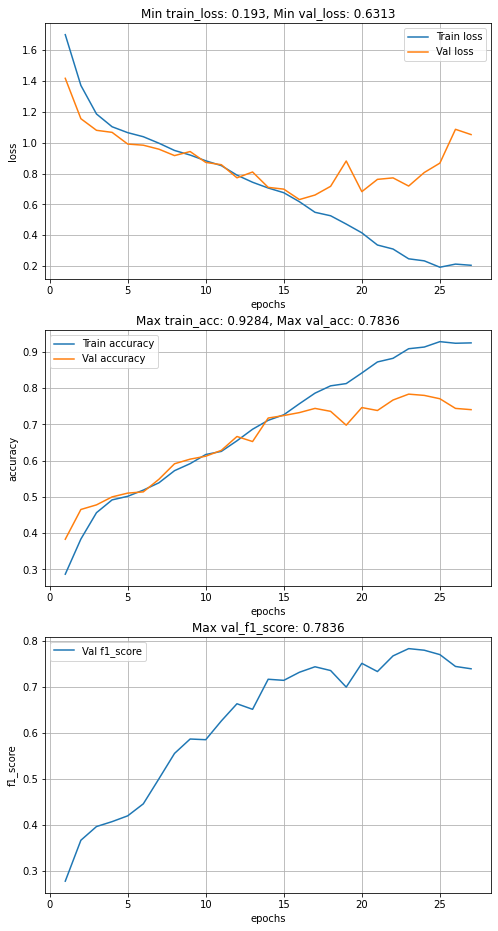

In [32]:
# evaluation metrics plot for model
plot_evaluation_metrics(base_history, name='base model')

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising confusion matrix on test data</p>

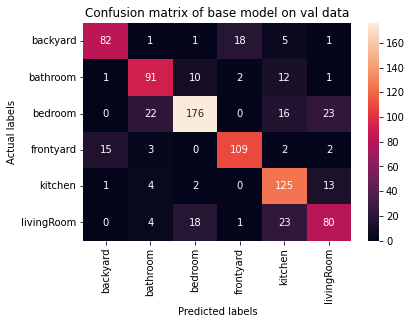

In [33]:
# ploting confusion matrix
plot_confusion_matrix(base_model, val_data_generator, name='base model')

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising random images with actual and predicted labels</p>

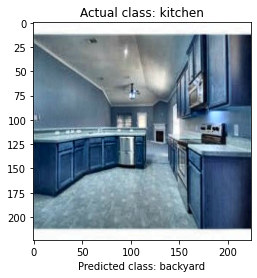



--------------------------------------------




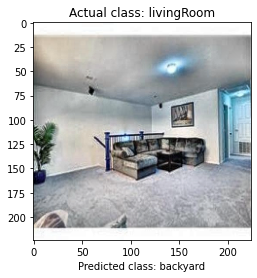



--------------------------------------------




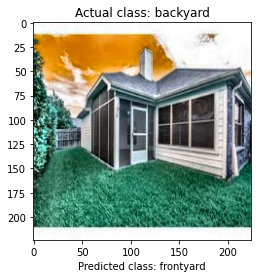



--------------------------------------------




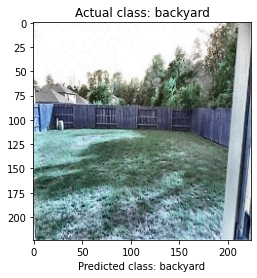



--------------------------------------------




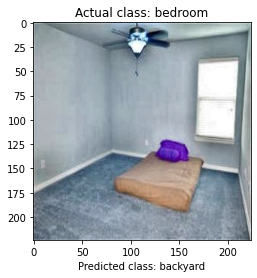



--------------------------------------------




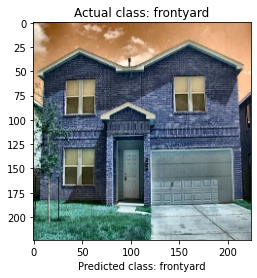



--------------------------------------------




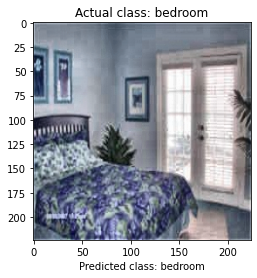



--------------------------------------------




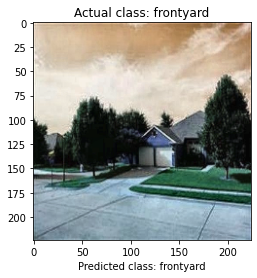



--------------------------------------------




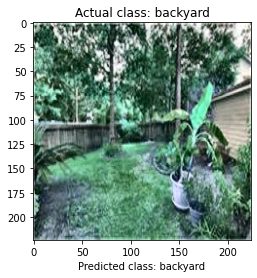



--------------------------------------------




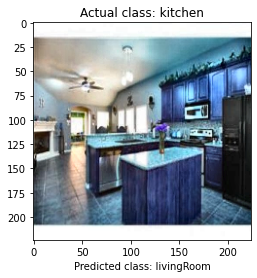



--------------------------------------------




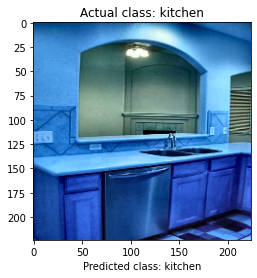



--------------------------------------------




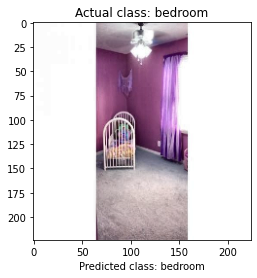



--------------------------------------------




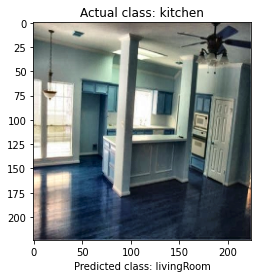



--------------------------------------------




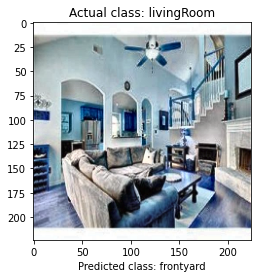



--------------------------------------------




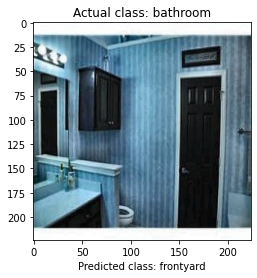



--------------------------------------------




In [34]:
# ploting 15-sample images with their actual and predicted labels
get_test_sample_predictions(base_model, get_enhanced_image, TARGET_SHAPE, sample=15)

In [35]:
# garbage collector
gc.collect()

71382

<p style="font-size:20px; font-style:italic; font-weight:bold">Observation</p>


<p style="font-size:14px; color:green; font-style:italic; ">From the above plot we can see that our base model performs well and achieves f1 and accuracy score of 78.36%.</p>
<p style="font-size:14px; color:green; font-style:italic; ">It is getting confused in differentiating between backyard-frontyard, bathroom-bedroom, bedrrom-livingroom, kitchen-livingroom.</p>
<p style="font-size:14px; color:green; font-style:italic; ">From the sample images plots we can see the confusion in prediction.</p>

<p style="font-size:17px; color:red; font-style:italic; ">10.2&ensp;Pretrained VGG16 based model</p>

<p style="font-size:17px; color:green; font-style:italic; "></p>


* <p style="font-size:14px; color:blue; font-style:italic; ">Loading pre-trained weights</p>

In [36]:
# importing VGG16 pretrained model weights and preprocessing function from tensorflow
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input

In [37]:
# clearing backend session
tf.keras.backend.clear_session()

In [38]:
# initializing VGG16 pretrained model
vgg16 = VGG16(include_top=False, 
                        input_shape=INPUT_SHAPE,
                        weights='imagenet')
# setting layers not to train
for layer in vgg16.layers:
    layer.trainable = False

# summarizing vgg16 pretrained architecture
vgg16.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

* <p style="font-size:14px; color:blue; font-style:italic; ">Defining model architecture and compiling</p>

In [39]:
# input layer
inputs = Input(shape=INPUT_SHAPE, name='input_shape')
# passing input layer to resnet 50
x = vgg16(inputs)
# Flatten layer
x = GlobalAveragePooling2D(name='global_pooling')(x)
# Dense layer
x = Dense(512, activation='relu', name='dense_1')(x)
# Dropout layer
x = Dropout(0.5, name='dropout_1')(x)
# Dense layer
x = Dense(64, activation='relu', name='dense_2')(x)
# Dropout layer
x = Dropout(0.5, name='dropout_2')(x)
# output layer
outputs = Dense(6, activation='softmax', name='output')(x)

# intialising model
vgg16_model = Model(inputs=inputs, outputs=outputs, name='vgg16_based_model')
# summarizing model
vgg16_model.summary()

Model: "vgg16_based_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_shape (InputLayer)     [(None, 224, 224, 3)]     0         
_________________________________________________________________
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
global_pooling (GlobalAverag (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               262656    
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                32832     
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)          

In [40]:
# compiling model
vgg16_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

* <p style="font-size:14px; color:blue; font-style:italic; ">Initialising data generator</p>

In [41]:
BATCH_SIZE=8
train_data_generator, val_data_generator = initialise_custom_datagenerator(preprocess_input, BATCH_SIZE=BATCH_SIZE)

Custome data generator initialised successfully!


* <p style="font-size:14px; color:blue; font-style:italic; ">fitting model on data</p>

In [42]:
callbacks = initialise_callbacks('base_model.h5')

Custom callbacks initialised successfully!
Model checkpoint name will be: "base_model.h5" 


In [43]:
# fitting data to the VGG16 based model
vgg16_history = vgg16_model.fit(train_data_generator, 
                 epochs=EPOCHS, 
                 batch_size=BATCH_SIZE, 
                 validation_data=val_data_generator,
                 callbacks=callbacks)

Epoch 1/50
622/622 [==============================] - 79s 120ms/step - loss: 1.3342 - accuracy: 0.5844 - val_loss: 0.4427 - val_accuracy: 0.8658
      [==============================]  - val_f1_score: 0.8647

Epoch 00001: val_f1_score improved from -inf to 0.86467, saving model to base_model.h5
Epoch 2/50
622/622 [==============================] - 81s 130ms/step - loss: 0.6189 - accuracy: 0.7749 - val_loss: 0.3499 - val_accuracy: 0.8853
      [==============================]  - val_f1_score: 0.8858

Epoch 00002: val_f1_score improved from 0.86467 to 0.88583, saving model to base_model.h5
Epoch 3/50
622/622 [==============================] - 84s 135ms/step - loss: 0.4860 - accuracy: 0.8300 - val_loss: 0.3875 - val_accuracy: 0.8555
      [==============================]  - val_f1_score: 0.8568

Epoch 00003: val_f1_score did not improve from 0.88583
Epoch 4/50
622/622 [==============================] - 81s 130ms/step - loss: 0.4030 - accuracy: 0.8621 - val_loss: 0.3332 - val_accuracy: 0.9

In [44]:
# vgg16 history
vgg16_history = vgg16_history.history

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising evaluation metrics using line plot</p>

Evaluation metrics plot for "VGG16 model" 


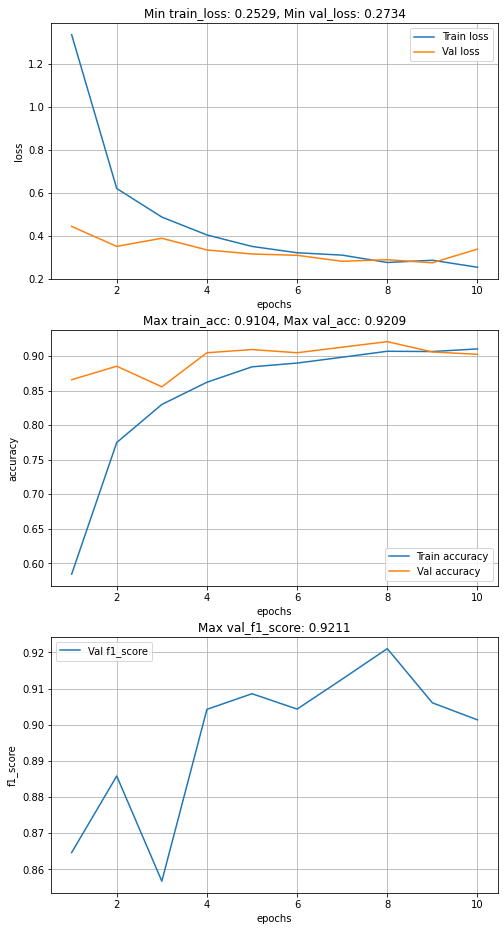

In [45]:
# evaluation metrics plot for model
plot_evaluation_metrics(vgg16_history, name='VGG16 model')

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising confusion matrix on test data</p>

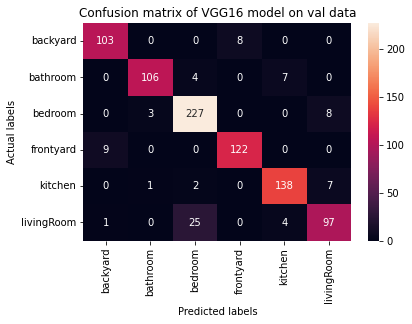

In [46]:
# ploting confusion matrix
plot_confusion_matrix(vgg16_model, val_data_generator, name='VGG16 model')

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising random images with actual and predicted labels</p>

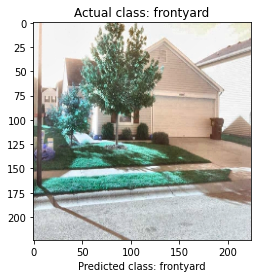



--------------------------------------------




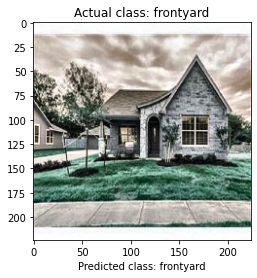



--------------------------------------------




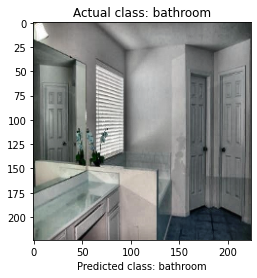



--------------------------------------------




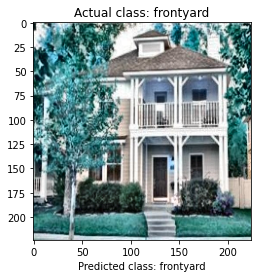



--------------------------------------------




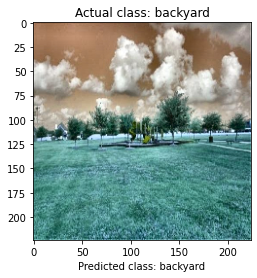



--------------------------------------------




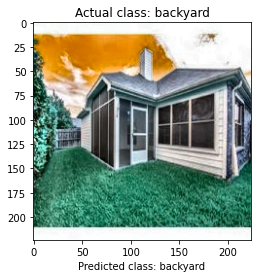



--------------------------------------------




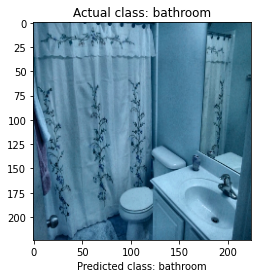



--------------------------------------------




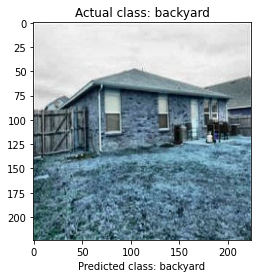



--------------------------------------------




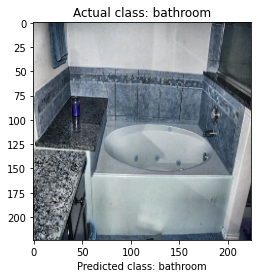



--------------------------------------------




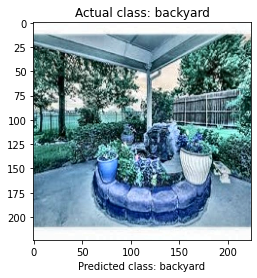



--------------------------------------------




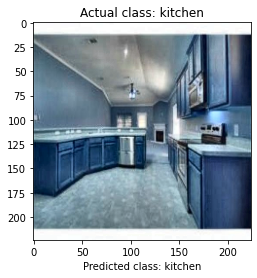



--------------------------------------------




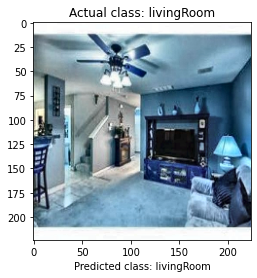



--------------------------------------------




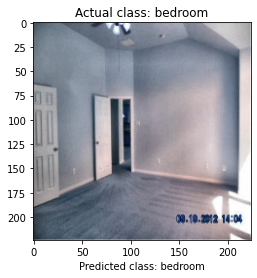



--------------------------------------------




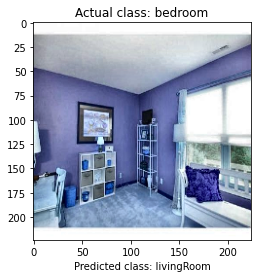



--------------------------------------------




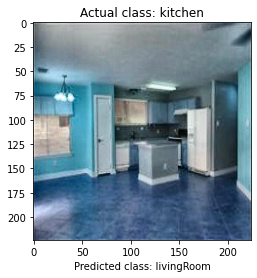



--------------------------------------------




In [47]:
# ploting 15-sample images with their actual and predicted labels
get_test_sample_predictions(vgg16_model, preprocess_input, TARGET_SHAPE, sample=15)

In [48]:
# garbage collector
gc.collect()

14464

<p style="font-size:20px; font-style:italic; font-weight:bold">Observation</p>


<p style="font-size:14px; color:green; font-style:italic; ">From the above plot we can see that our VGG16 based model performs better than base model and achieves f1 and accuracy score of 92.11%.</p>
<p style="font-size:14px; color:green; font-style:italic; ">It is getting confused in differentiating between backyard-frontyard, bedroom-livingroom mostly than the rest of classes.</p>
<p style="font-size:14px; color:green; font-style:italic; ">From the sample images plots we can see the confusion in prediction.</p>
<p style="font-size:14px; color:green; font-style:italic; "></p>
<p style="font-size:14px; color:green; font-style:italic; "></p>






<p style="font-size:17px; color:red; font-style:italic; ">10.3&ensp;Pretrained VGG19 based model</p>

<p style="font-size:17px; color:green; font-style:italic; "></p>


* <p style="font-size:14px; color:blue; font-style:italic; ">Loading pre-trained weights</p>

In [49]:
# importing vgg19 pretrained model weights and its preprocesing function
from tensorflow.keras.applications.vgg19 import VGG19, preprocess_input

In [50]:
# clearing backend sessions
tf.keras.backend.clear_session()

In [51]:
# initializing VGG19 pretrained model
vgg19 = VGG19(include_top=False, 
                        input_shape=INPUT_SHAPE,
                        weights='imagenet')
# setting layers not to train
for layer in vgg19.layers:
    layer.trainable = False
# summarizing vgg19 pretrained architecture  
vgg19.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

* <p style="font-size:14px; color:blue; font-style:italic; ">Defining model architecture and compiling</p>

In [52]:
# input layer
inputs = Input(shape=INPUT_SHAPE, name='input_shape')
# passing input layer to resnet 50
x = vgg19(inputs)
# Flatten layer
x = GlobalAveragePooling2D(name='global_pooling')(x)
# Dense layer
x = Dense(512, activation='relu', name='dense_1')(x)
# Dropout layer
x = Dropout(0.5, name='dropout_1')(x)
# Dense layer
x = Dense(64, activation='relu', name='dense_2')(x)
# Dropout layer
x = Dropout(0.5, name='dropout_2')(x)
# output layer
outputs = Dense(6, activation='softmax', name='output')(x)

# intialising model
vgg19_model = Model(inputs=inputs, outputs=outputs, name='vgg19_based_model')
# summarizing model
vgg19_model.summary()

Model: "vgg19_based_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_shape (InputLayer)     [(None, 224, 224, 3)]     0         
_________________________________________________________________
vgg19 (Functional)           (None, 7, 7, 512)         20024384  
_________________________________________________________________
global_pooling (GlobalAverag (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               262656    
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                32832     
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)          

In [53]:
# compiling vgg19 model
vgg19_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

* <p style="font-size:14px; color:blue; font-style:italic; ">Initialising data generator</p>

In [54]:
BATCH_SIZE=4
train_data_generator, val_data_generator = initialise_custom_datagenerator(preprocess_input, BATCH_SIZE=BATCH_SIZE)

Custome data generator initialised successfully!


* <p style="font-size:14px; color:blue; font-style:italic; ">fitting model on data</p>

In [55]:
callbacks = initialise_callbacks('vgg19_model.h5')

Custom callbacks initialised successfully!
Model checkpoint name will be: "vgg19_model.h5" 


In [56]:
# fitting VGG19 based model on out data
vgg19_history = vgg19_model.fit(train_data_generator, 
                 epochs=EPOCHS, 
                 batch_size=BATCH_SIZE, 
                 validation_data=val_data_generator,
                 callbacks=callbacks)

Epoch 1/50
1245/1245 [==============================] - 97s 75ms/step - loss: 1.3414 - accuracy: 0.5231 - val_loss: 0.5369 - val_accuracy: 0.8562
      [==============================]  - val_f1_score: 0.8523

Epoch 00001: val_f1_score improved from -inf to 0.85233, saving model to vgg19_model.h5
Epoch 2/50
1245/1245 [==============================] - 94s 75ms/step - loss: 0.6993 - accuracy: 0.7347 - val_loss: 0.3991 - val_accuracy: 0.8710
      [==============================]  - val_f1_score: 0.87

Epoch 00002: val_f1_score improved from 0.85233 to 0.87002, saving model to vgg19_model.h5
Epoch 3/50
1245/1245 [==============================] - 94s 75ms/step - loss: 0.5066 - accuracy: 0.8163 - val_loss: 0.3572 - val_accuracy: 0.8790
      [==============================]  - val_f1_score: 0.8783

Epoch 00003: val_f1_score improved from 0.87002 to 0.87829, saving model to vgg19_model.h5
Epoch 4/50
1245/1245 [==============================] - 96s 77ms/step - loss: 0.4415 - accuracy: 0.852

In [57]:
# vgg19 history
vgg19_history = vgg19_history.history

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising evaluation metrics using line plot</p>

Evaluation metrics plot for "VGG19 model" 


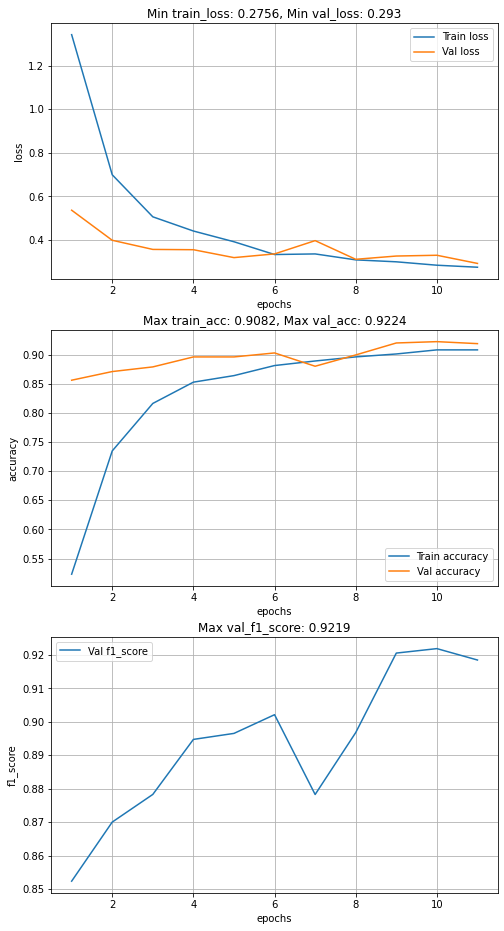

In [58]:
# evaluation metrics plot for model
plot_evaluation_metrics(vgg19_history, name='VGG19 model')

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising confusion matrix on test data</p>

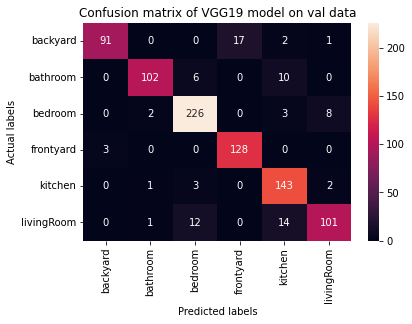

In [59]:
# ploting confusion matrix
plot_confusion_matrix(vgg19_model, val_data_generator, name='VGG19 model')

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising random images with actual and predicted labels</p>

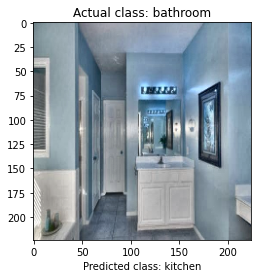



--------------------------------------------




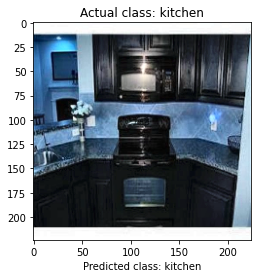



--------------------------------------------




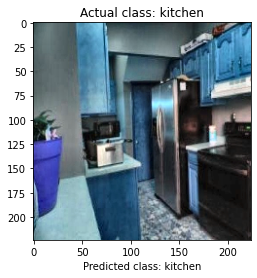



--------------------------------------------




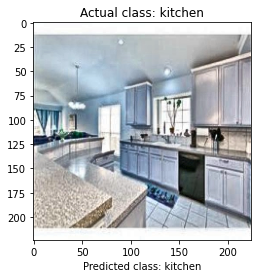



--------------------------------------------




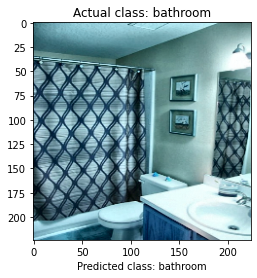



--------------------------------------------




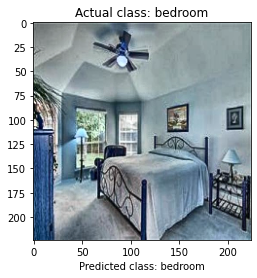



--------------------------------------------




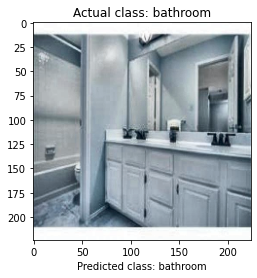



--------------------------------------------




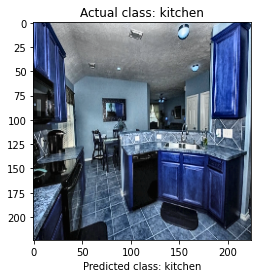



--------------------------------------------




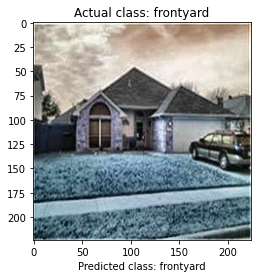



--------------------------------------------




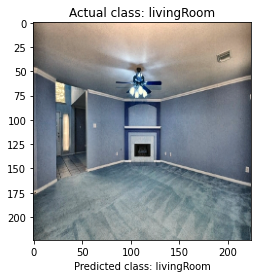



--------------------------------------------




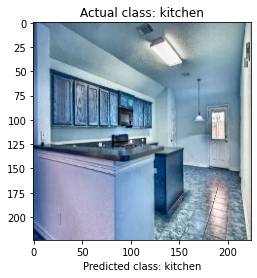



--------------------------------------------




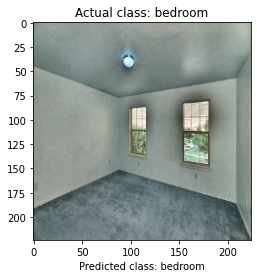



--------------------------------------------




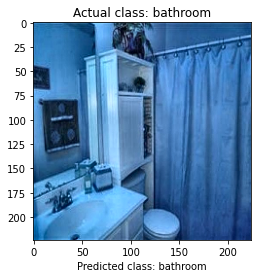



--------------------------------------------




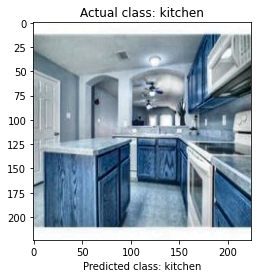



--------------------------------------------




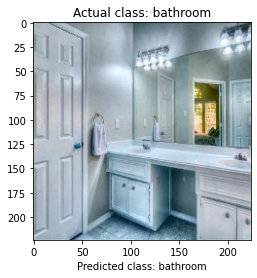



--------------------------------------------




In [60]:
# ploting 15-sample images with their actual and predicted labels
get_test_sample_predictions(vgg19_model, preprocess_input, TARGET_SHAPE, sample=15)

In [61]:
# garbage collector
gc.collect()

28116

<p style="font-size:20px; font-style:italic; font-weight:bold">Observation</p>


<p style="font-size:14px; color:green; font-style:italic; ">From the above plot we can see that our VGG19 based model performs better than base model and achieves f1 and accuracy score of 92.19%, but it passes slightly the VGG16 based model.</p>
<p style="font-size:14px; color:green; font-style:italic; ">It is getting confused in differentiating between backyard-frontyard, bedroom-livingroom mostly than the rest of classes.</p>
<p style="font-size:14px; color:green; font-style:italic; ">From the sample images plots we can see the confusion in prediction.</p>
<p style="font-size:14px; color:green; font-style:italic; "></p>
<p style="font-size:14px; color:green; font-style:italic; "></p>

<p style="font-size:17px; color:red; font-style:italic; ">10.4&ensp;Pretrained ResNet-50 based model</p>

<p style="font-size:17px; color:green; font-style:italic; "></p>


* <p style="font-size:14px; color:blue; font-style:italic; ">Loading pre-trained weights</p>

In [62]:
# importing Resnet-50, Resnet-152 pretrained weights and its preprocessing function
from tensorflow.keras.applications.resnet import ResNet50, ResNet152, preprocess_input

In [63]:
# clearing backend session
tf.keras.backend.clear_session()

In [64]:
# initializing ResNet50 pretrained model
resnet50 = ResNet50(include_top=False, 
                        input_shape=INPUT_SHAPE,
                        weights='imagenet')
# setting layers not to train
for layer in resnet50.layers:
    layer.trainable = False
# summarizing ResNet50 pretrained architecture  
resnet50.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
___________________________________________________________________________________________

* <p style="font-size:14px; color:blue; font-style:italic; ">Defining model architecture and compiling</p>

In [65]:
# input layer
inputs = Input(shape=INPUT_SHAPE, name='input_shape')
# passing input layer to resnet 50
x = resnet50(inputs)
# Flatten layer
x = GlobalAveragePooling2D(name='global_pooling')(x)
# Dense layer
x = Dense(1024, activation='relu', name='dense_1')(x)
# Dropout layer
x = Dropout(0.5, name='dropout_1')(x)
# Dense layer
x = Dense(64, activation='relu', name='dense_2')(x)
# Dropout layer
x = Dropout(0.5, name='dropout_2')(x)
# output layer
outputs = Dense(6, activation='softmax', name='output')(x)

# intialising model
resnet50_model = Model(inputs=inputs, outputs=outputs, name='resnet50_based_model')
# summarizing model
resnet50_model.summary()

Model: "resnet50_based_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_shape (InputLayer)     [(None, 224, 224, 3)]     0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_pooling (GlobalAverag (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              2098176   
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                65600     
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)       

In [66]:
# compiling model
resnet50_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

* <p style="font-size:14px; color:blue; font-style:italic; ">Initialising data generator</p>

In [67]:
BATCH_SIZE = 4
train_data_generator, val_data_generator = initialise_custom_datagenerator(preprocess_input, BATCH_SIZE=BATCH_SIZE)

Custome data generator initialised successfully!


* <p style="font-size:14px; color:blue; font-style:italic; ">fitting model on data</p>

In [68]:
callbacks = initialise_callbacks('resnet50_model.h5')

Custom callbacks initialised successfully!
Model checkpoint name will be: "resnet50_model.h5" 


In [69]:
# ftting data on resnet50 model
resnet50_history = resnet50_model.fit(train_data_generator, 
                 epochs=EPOCHS, 
                 batch_size=BATCH_SIZE, 
                 validation_data=val_data_generator,
                 callbacks=callbacks)

Epoch 1/50
1245/1245 [==============================] - 60s 46ms/step - loss: 1.0198 - accuracy: 0.6303 - val_loss: 0.2778 - val_accuracy: 0.9041
      [==============================]  - val_f1_score: 0.9041

Epoch 00001: val_f1_score improved from -inf to 0.90410, saving model to resnet50_model.h5
Epoch 2/50
1245/1245 [==============================] - 56s 45ms/step - loss: 0.5338 - accuracy: 0.8110 - val_loss: 0.2460 - val_accuracy: 0.9189
      [==============================]  - val_f1_score: 0.9196

Epoch 00002: val_f1_score improved from 0.90410 to 0.91960, saving model to resnet50_model.h5
Epoch 3/50
1245/1245 [==============================] - 57s 46ms/step - loss: 0.4062 - accuracy: 0.8663 - val_loss: 0.2560 - val_accuracy: 0.9201
      [==============================]  - val_f1_score: 0.9203

Epoch 00003: val_f1_score improved from 0.91960 to 0.92027, saving model to resnet50_model.h5
Epoch 4/50
1245/1245 [==============================] - 56s 45ms/step - loss: 0.3413 - accu

In [70]:
# ResNet50 history
resnet50_history = resnet50_history.history

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising evaluation metrics using line plot</p>

Evaluation metrics plot for "ResNet_50 model" 


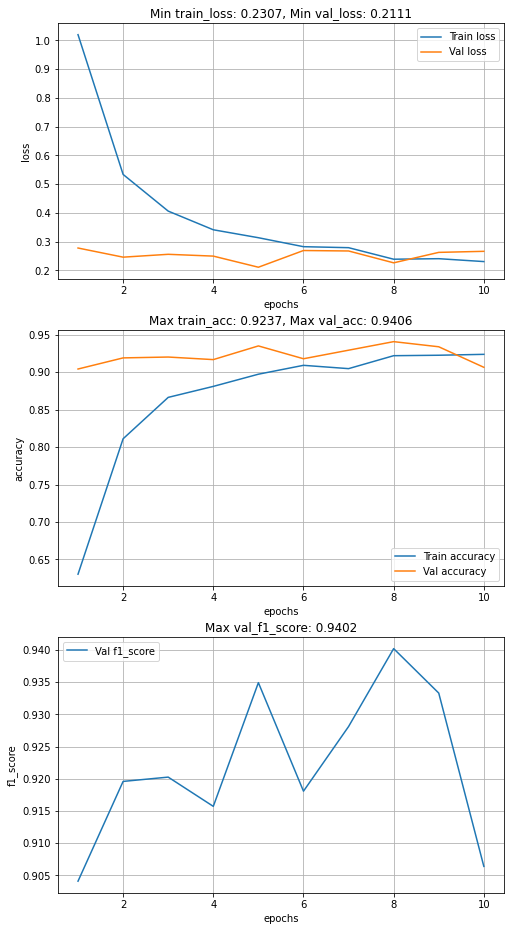

In [71]:
# evaluation metrics plot for model
plot_evaluation_metrics(resnet50_history, name='ResNet_50 model')

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising confusion matrix on test data</p>

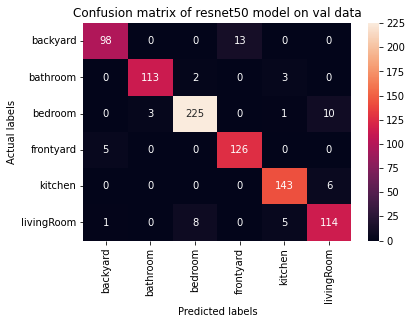

In [72]:
# ploting confusion matrix
plot_confusion_matrix(resnet50_model, val_data_generator, name='resnet50 model')

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising random images with actual and predicted labels</p>

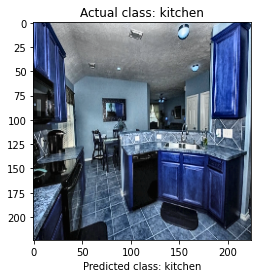



--------------------------------------------




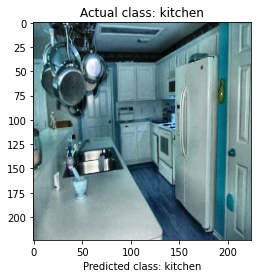



--------------------------------------------




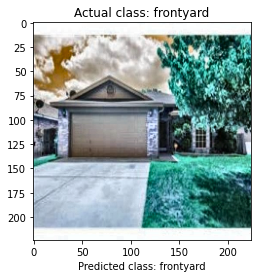



--------------------------------------------




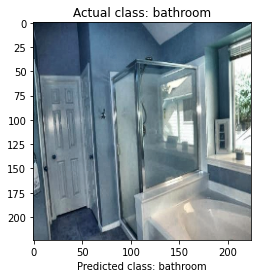



--------------------------------------------




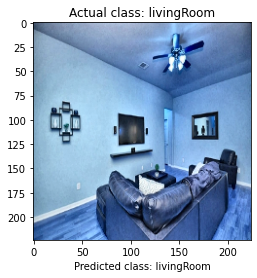



--------------------------------------------




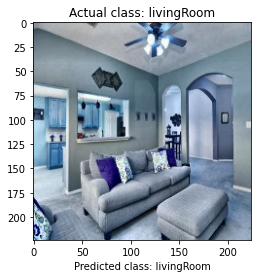



--------------------------------------------




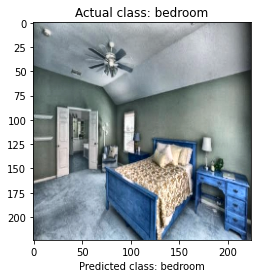



--------------------------------------------




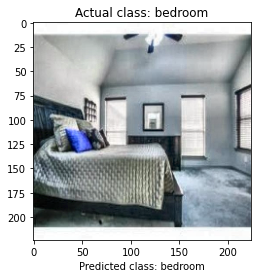



--------------------------------------------




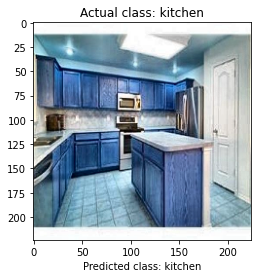



--------------------------------------------




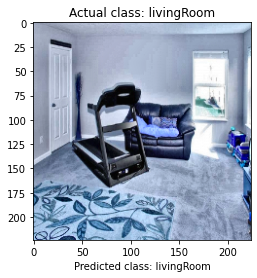



--------------------------------------------




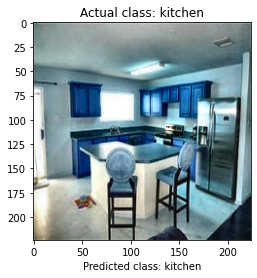



--------------------------------------------




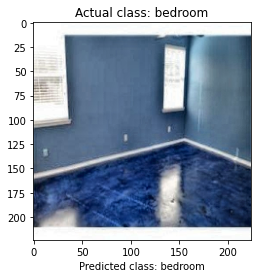



--------------------------------------------




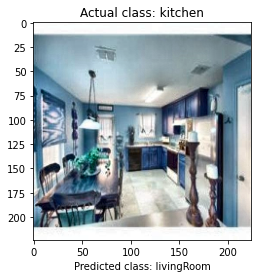



--------------------------------------------




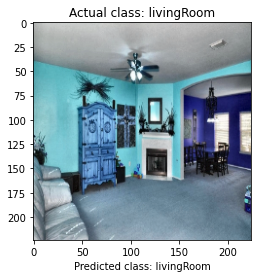



--------------------------------------------




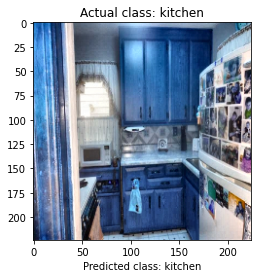



--------------------------------------------




In [73]:
# ploting 15-sample images with their actual and predicted labels
get_test_sample_predictions(resnet50_model, preprocess_input, TARGET_SHAPE, sample=15)

In [74]:
# garbage collector
gc.collect()

82340

<p style="font-size:20px; font-style:italic; font-weight:bold">Observation</p>


<p style="font-size:14px; color:green; font-style:italic; ">From the above plot we can see that our RESNET-50 based model performs better than base model and achieves f1 and accuracy score of 94.02%, and it also performed well from both VGG16 based model.</p>
<p style="font-size:14px; color:green; font-style:italic; ">It is getting confused in differentiating between backyard-frontyard, bedroom-livingroom mostly than the rest of classes. But the false predictions is lower than the earlier models.</p>
<p style="font-size:14px; color:green; font-style:italic; ">From the sample images plots we can see the confusion in prediction.</p>
<p style="font-size:14px; color:green; font-style:italic; "></p>
<p style="font-size:14px; color:green; font-style:italic; "></p>

<p style="font-size:17px; color:red; font-style:italic; ">10.5&ensp;Pretrained ResNet-152 based model</p>

<p style="font-size:17px; color:green; font-style:italic; "></p>


* <p style="font-size:14px; color:blue; font-style:italic; ">Loading pre-trained weights</p>

In [75]:
from tensorflow.keras.applications.resnet import ResNet152, preprocess_input

In [76]:
tf.keras.backend.clear_session()

In [77]:
# initializing ResNet152 pretrained model
resnet152 = ResNet152(include_top=False, 
                        input_shape=INPUT_SHAPE,
                        weights='imagenet')
# setting layers not to train
for layer in resnet152.layers:
    layer.trainable = False
# summarizing ResNet152 pretrained architecture    
resnet152.summary()

Model: "resnet152"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
__________________________________________________________________________________________

* <p style="font-size:14px; color:blue; font-style:italic; ">Defining model architecture and compiling</p>

In [78]:
# input layer
inputs = Input(shape=INPUT_SHAPE, name='input_shape')
# passing input layer to resnet 50
x = resnet152(inputs)
# Flatten layer
x = GlobalAveragePooling2D(name='global_pooling')(x)
# Dense layer
x = Dense(1024, activation='relu', name='dense_1')(x)
# Dropout layer
x = Dropout(0.5, name='dropout_1')(x)
# Dense layer
x = Dense(64, activation='relu', name='dense_2')(x)
# Dropout layer
x = Dropout(0.5, name='dropout_2')(x)
# output layer
outputs = Dense(6, activation='softmax', name='output')(x)

# intialising model
resnet152_model = Model(inputs=inputs, outputs=outputs, name='resnet152_based_model')
# summarizing model
resnet152_model.summary()

Model: "resnet152_based_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_shape (InputLayer)     [(None, 224, 224, 3)]     0         
_________________________________________________________________
resnet152 (Functional)       (None, 7, 7, 2048)        58370944  
_________________________________________________________________
global_pooling (GlobalAverag (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              2098176   
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                65600     
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)      

In [79]:
# compiling resnet152 based model
resnet152_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

* <p style="font-size:14px; color:blue; font-style:italic; ">Initialising data generator</p>

In [80]:
BATCH_SIZE=1
train_data_generator, val_data_generator = initialise_custom_datagenerator(preprocess_input, BATCH_SIZE=BATCH_SIZE)

Custome data generator initialised successfully!


* <p style="font-size:14px; color:blue; font-style:italic; ">fitting model on data</p>

In [81]:
callbacks = initialise_callbacks('resnet152_model.h5')

Custom callbacks initialised successfully!
Model checkpoint name will be: "resnet152_model.h5" 


In [82]:
# fitting resnet152 based model to the data
resnet152_history = resnet152_model.fit(train_data_generator, 
                 epochs=EPOCHS, 
                 batch_size=BATCH_SIZE, 
                 validation_data=val_data_generator,
                 callbacks=callbacks)

Epoch 1/50
4980/4980 [==============================] - 284s 56ms/step - loss: 1.4123 - accuracy: 0.4641 - val_loss: 0.6831 - val_accuracy: 0.8043
      [==============================]  - val_f1_score: 0.8027

Epoch 00001: val_f1_score improved from -inf to 0.80274, saving model to resnet152_model.h5
Epoch 2/50
4980/4980 [==============================] - 276s 55ms/step - loss: 0.8225 - accuracy: 0.6920 - val_loss: 0.4384 - val_accuracy: 0.8760
      [==============================]  - val_f1_score: 0.8751

Epoch 00002: val_f1_score improved from 0.80274 to 0.87515, saving model to resnet152_model.h5
Epoch 3/50
4980/4980 [==============================] - 278s 56ms/step - loss: 0.6516 - accuracy: 0.7807 - val_loss: 0.3082 - val_accuracy: 0.9044
      [==============================]  - val_f1_score: 0.9056

Epoch 00003: val_f1_score improved from 0.87515 to 0.90555, saving model to resnet152_model.h5
Epoch 4/50
4980/4980 [==============================] - 276s 55ms/step - loss: 0.5362

In [83]:
# resnet152 history
resnet152_history = resnet152_history.history

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising evaluation metrics using line plot</p>

Evaluation metrics plot for "ResNet_152 model" 


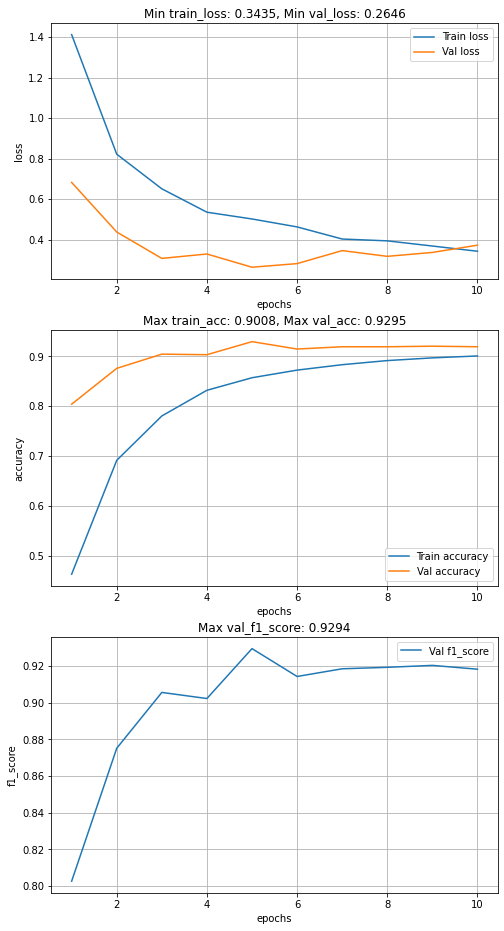

In [84]:
# evaluation metrics plot for model
plot_evaluation_metrics(resnet152_history, name='ResNet_152 model')

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising confusion matrix on test data</p>

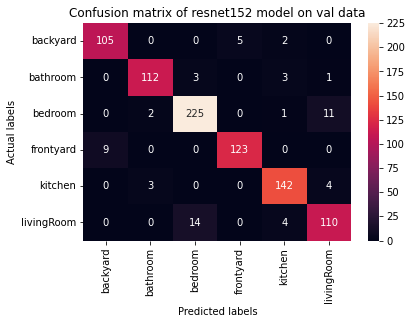

In [85]:
# ploting confusion matrix
plot_confusion_matrix(resnet152_model, val_data_generator, name='resnet152 model')

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising random images with actual and predicted labels</p>

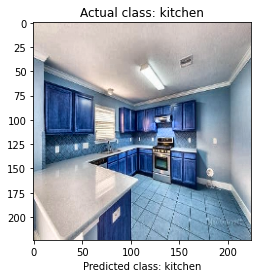



--------------------------------------------




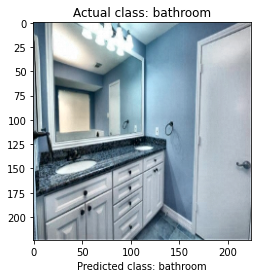



--------------------------------------------




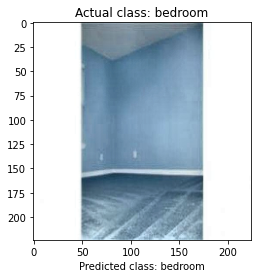



--------------------------------------------




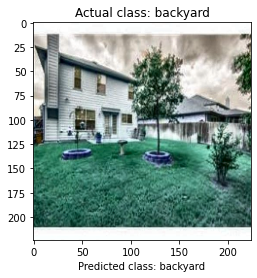



--------------------------------------------




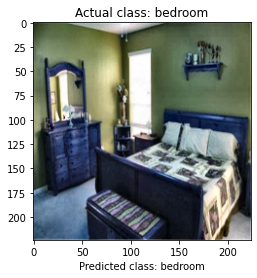



--------------------------------------------




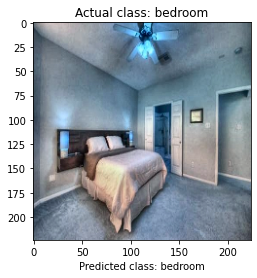



--------------------------------------------




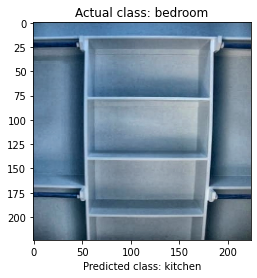



--------------------------------------------




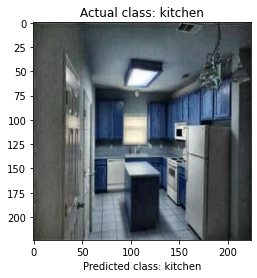



--------------------------------------------




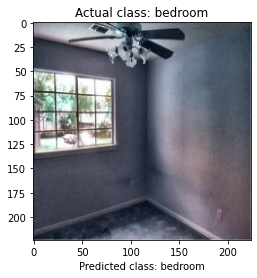



--------------------------------------------




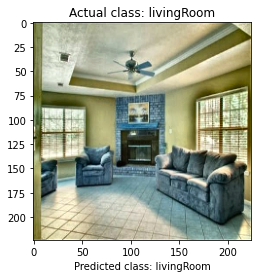



--------------------------------------------




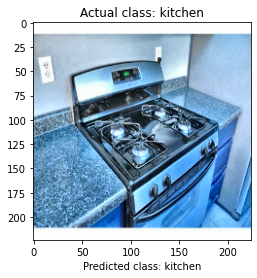



--------------------------------------------




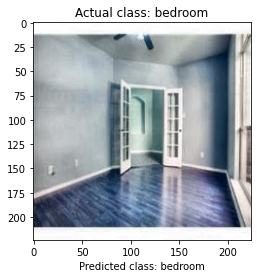



--------------------------------------------




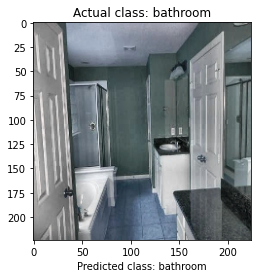



--------------------------------------------




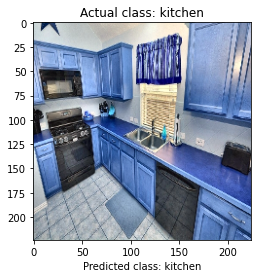



--------------------------------------------




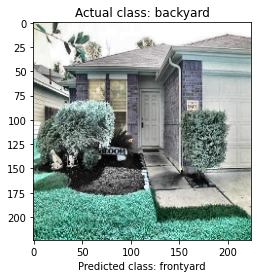



--------------------------------------------




In [86]:
# ploting 15-sample images with their actual and predicted labels
get_test_sample_predictions(resnet152_model, preprocess_input, TARGET_SHAPE, sample=15)

In [87]:
# garbage collector
gc.collect()

126599

<p style="font-size:20px; font-style:italic; font-weight:bold">Observation</p>


<p style="font-size:14px; color:green; font-style:italic; ">From the above plot we can see that our RESNET-152 based model performs better than base model and achieves f1 and accuracy score of 92.92%, and it also performed well from both VGG16 based model.</p>

<p style="font-size:14px; color:green; font-style:italic; ">But it is lagging from its counter part resnet50</p>

<p style="font-size:14px; color:green; font-style:italic; ">It is getting confused in differentiating between bedroom-livingroom mostly than the rest of classes. But the false predictions is lower than the earlier models.</p>
<p style="font-size:14px; color:green; font-style:italic; ">From the sample images plots we can see the confusion in prediction.</p>
<p style="font-size:14px; color:green; font-style:italic; "></p>
<p style="font-size:14px; color:green; font-style:italic; "></p>

<p style="font-size:17px; color:red; font-style:italic; ">10.6&ensp;Pretrained InceptionV3 based model</p>

<p style="font-size:17px; color:green; font-style:italic; "></p>


* <p style="font-size:14px; color:blue; font-style:italic; ">Loading pre-trained weights</p>

In [88]:
# clearing backend sessions
tf.keras.backend.clear_session()

In [89]:
# importing inceptionv3 pretrained weights and respected preprocess function
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
# initializing ResNet152 pretrained model
inceptionv3 = InceptionV3(include_top=False, 
                        input_shape=INPUT_SHAPE,
                        weights='imagenet')
# setting layers not to train
for layer in inceptionv3.layers:
    layer.trainable = False
# summarizing ResNet152 pretrained architecture   
inceptionv3.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 111, 111, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 111, 111, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 111, 111, 32) 0           batch_normalization[0][0]        
_______________________________________________________________________________________

* <p style="font-size:14px; color:blue; font-style:italic; ">Defining model architecture and compiling</p>

In [90]:
# input layer
inputs = Input(shape=INPUT_SHAPE, name='input_shape')
# passing input layer to resnet 50
x = inceptionv3(inputs)
# Flatten layer
x = GlobalAveragePooling2D(name='global_pooling')(x)
# Dense layer
x = Dense(1024, activation='relu', name='dense_1')(x)
# Dropout layer
x = Dropout(0.5, name='dropout_1')(x)
# Dense layer
x = Dense(64, activation='relu', name='dense_2')(x)
# Dropout layer
x = Dropout(0.5, name='dropout_2')(x)
# output layer
outputs = Dense(6, activation='softmax', name='output')(x)

# intialising model
inceptionv3_model = Model(inputs=inputs, outputs=outputs, name='inceptionv3_based_model')
# summarizing model
inceptionv3_model.summary()

Model: "inceptionv3_based_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_shape (InputLayer)     [(None, 224, 224, 3)]     0         
_________________________________________________________________
inception_v3 (Functional)    (None, 5, 5, 2048)        21802784  
_________________________________________________________________
global_pooling (GlobalAverag (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              2098176   
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                65600     
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)    

In [91]:
# compiling model
inceptionv3_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

* <p style="font-size:14px; color:blue; font-style:italic; ">Initialising data generator</p>

In [92]:
BATCH_SIZE=2
train_data_generator, val_data_generator = initialise_custom_datagenerator(preprocess_input, BATCH_SIZE=BATCH_SIZE)

Custome data generator initialised successfully!


* <p style="font-size:14px; color:blue; font-style:italic; ">fitting model on data</p>

In [93]:
callbacks = initialise_callbacks('inceptionv3_model.h5')

Custom callbacks initialised successfully!
Model checkpoint name will be: "inceptionv3_model.h5" 


In [94]:
# fitting inceptionv3 based history
inceptionv3_history = inceptionv3_model.fit(train_data_generator, 
                 epochs=EPOCHS, 
                 batch_size=BATCH_SIZE, 
                 validation_data=val_data_generator,
                 callbacks=callbacks)

Epoch 1/50
2490/2490 [==============================] - 80s 31ms/step - loss: 1.3130 - accuracy: 0.5072 - val_loss: 0.6056 - val_accuracy: 0.7358
      [==============================]  - val_f1_score: 0.7074

Epoch 00001: val_f1_score improved from -inf to 0.70745, saving model to inceptionv3_model.h5
Epoch 2/50
2490/2490 [==============================] - 76s 31ms/step - loss: 0.7576 - accuracy: 0.6944 - val_loss: 0.4878 - val_accuracy: 0.8064
      [==============================]  - val_f1_score: 0.7943

Epoch 00002: val_f1_score improved from 0.70745 to 0.79432, saving model to inceptionv3_model.h5
Epoch 3/50
2490/2490 [==============================] - 76s 30ms/step - loss: 0.6131 - accuracy: 0.7697 - val_loss: 0.4156 - val_accuracy: 0.8360
      [==============================]  - val_f1_score: 0.839

Epoch 00003: val_f1_score improved from 0.79432 to 0.83901, saving model to inceptionv3_model.h5
Epoch 4/50
2490/2490 [==============================] - 76s 30ms/step - loss: 0.559

In [95]:
#inceptionv3 history
inceptionv3_history = inceptionv3_history.history

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising evaluation metrics on line plot</p>

Evaluation metrics plot for "Inception_v3 model" 


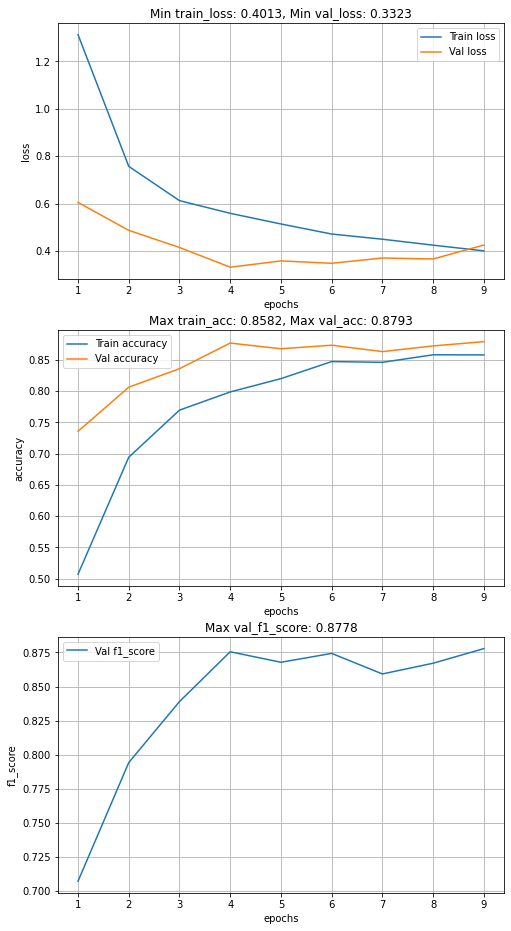

In [96]:
# evaluation metrics plot for model
plot_evaluation_metrics(inceptionv3_history, name='Inception_v3 model')

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising confusion matrix on test data</p>

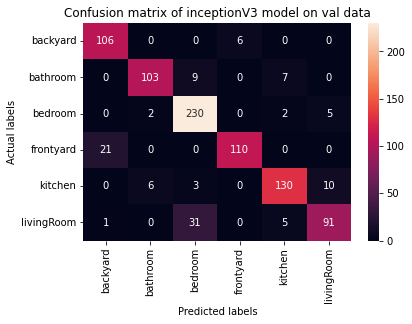

In [97]:
# ploting confusion matrix
plot_confusion_matrix(inceptionv3_model, val_data_generator, name='inceptionV3 model')

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising random images with actual and predicted labels</p>

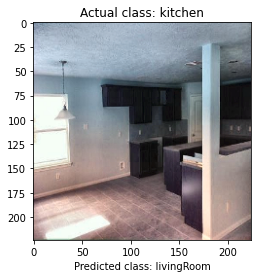



--------------------------------------------




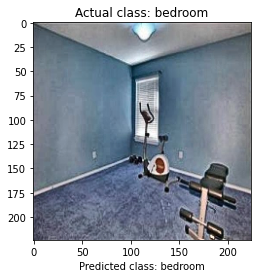



--------------------------------------------




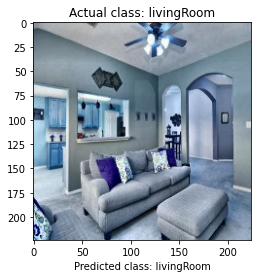



--------------------------------------------




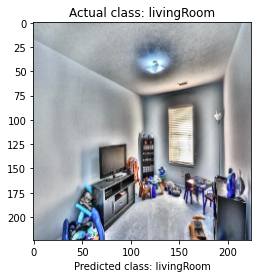



--------------------------------------------




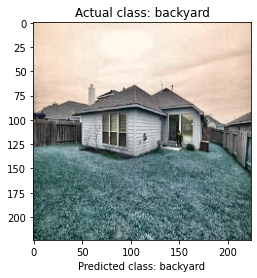



--------------------------------------------




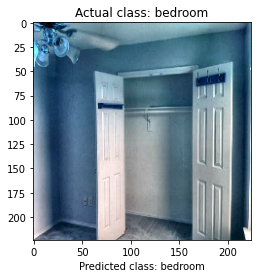



--------------------------------------------




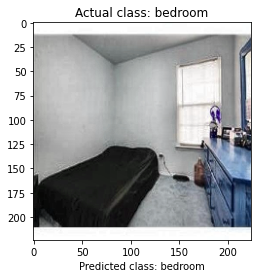



--------------------------------------------




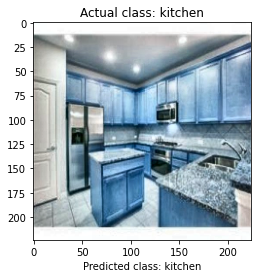



--------------------------------------------




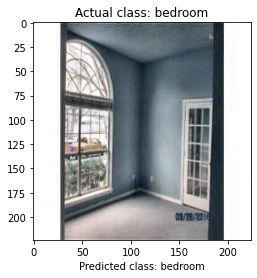



--------------------------------------------




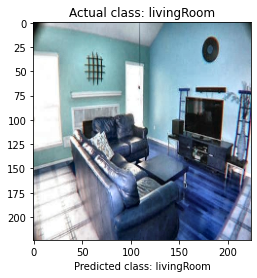



--------------------------------------------




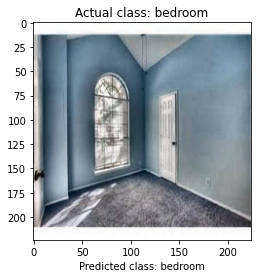



--------------------------------------------




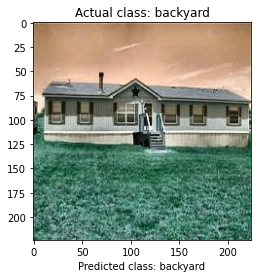



--------------------------------------------




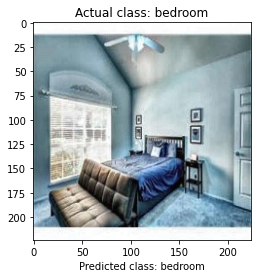



--------------------------------------------




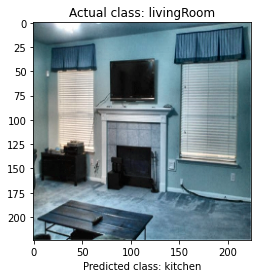



--------------------------------------------




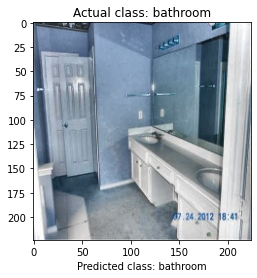



--------------------------------------------




In [98]:
# ploting 15-sample images with their actual and predicted labels
get_test_sample_predictions(inceptionv3_model, preprocess_input, TARGET_SHAPE, sample=15)

In [99]:
# garbage collector
gc.collect()

76242

<p style="font-size:20px; font-style:italic; font-weight:bold">Observation</p>


<p style="font-size:14px; color:green; font-style:italic; ">From the above plot we can see that our InceptionV3 based model performs better than base model and achieves f1 and accuracy score of 87.78%, and it does not perform well from rest of the pretrained based model.</p>

<p style="font-size:14px; color:green; font-style:italic; ">It is getting confused in differentiating between bedroom-livingroom, backyard-frontyard, bathroom-bedroom mostly than the rest of classes. But the false predictions is lower than the earlier models.</p>
<p style="font-size:14px; color:green; font-style:italic; ">From the sample images plots we can see the confusion in prediction.</p>
<p style="font-size:14px; color:green; font-style:italic; "></p>
<p style="font-size:14px; color:green; font-style:italic; "></p>

<p style="font-size:17px; color:red; font-style:italic; ">10.7&ensp;Pretrained EfficientNet-B0 based model</p>

<p style="font-size:17px; color:green; font-style:italic; "></p>


* <p style="font-size:14px; color:blue; font-style:italic; ">Loading pre-trained weights</p>

In [100]:
# importing efficient
from tensorflow.keras.applications.efficientnet import EfficientNetB0, preprocess_input

In [101]:
# clearing previous session
tf.keras.backend.clear_session()

In [102]:
# loading efficientnet model
efn = EfficientNetB0(include_top=False, 
                        input_shape=INPUT_SHAPE,
                        weights='imagenet')
# setting layers not to train on our data
for layer in efn.layers:
    layer.trainable = False
# summarizing pretrained efficient model
efn.summary()

Model: "efficientnetb0"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
rescaling (Rescaling)           (None, 224, 224, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
normalization (Normalization)   (None, 224, 224, 3)  7           rescaling[0][0]                  
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 225, 225, 3)  0           normalization[0][0]              
_____________________________________________________________________________________

* <p style="font-size:14px; color:blue; font-style:italic; ">Defining model architecture and compiling</p>

In [103]:
# input layer
inputs = Input(shape=INPUT_SHAPE, name='input_shape')
# passing input layer to resnet 50
x = efn(inputs)
# Global pulling layer
x = GlobalAveragePooling2D(name='global_pooling')(x)
# Dense layer
x = Dense(1024, activation='relu', name='dense_1')(x)
# Dropout layer
x = Dropout(0.5, name='dropout_1')(x)
# Dense layer
x = Dense(64, activation='relu', name='dense_2')(x)
# Dropout layer
x = Dropout(0.5, name='dropout_2')(x)
# output layer
outputs = Dense(6, activation='softmax', name='output')(x)

# intialising model
efficientNet_model = Model(inputs=inputs, outputs=outputs, name='efficientNet_based_model')
# summarizing model
efficientNet_model.summary()

Model: "efficientNet_based_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_shape (InputLayer)     [(None, 224, 224, 3)]     0         
_________________________________________________________________
efficientnetb0 (Functional)  (None, 7, 7, 1280)        4049571   
_________________________________________________________________
global_pooling (GlobalAverag (None, 1280)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              1311744   
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                65600     
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)   

In [104]:
# compiling efficient net model
efficientNet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

* <p style="font-size:14px; color:blue; font-style:italic; ">Initialising data generator</p>

In [105]:
BATCH_SIZE=2
train_data_generator, val_data_generator = initialise_custom_datagenerator(preprocess_input, BATCH_SIZE=BATCH_SIZE)

Custome data generator initialised successfully!


* <p style="font-size:14px; color:blue; font-style:italic; ">fitting model on data</p>

In [106]:
callbacks = initialise_callbacks('efficientNetB0_model.h5')

Custom callbacks initialised successfully!
Model checkpoint name will be: "efficientNetB0_model.h5" 


In [107]:
# fitting efficientnet  B0 model
efficientNet_history = efficientNet_model.fit(train_data_generator, 
                 epochs=EPOCHS, 
                 batch_size=BATCH_SIZE, 
                 validation_data=val_data_generator,
                 callbacks=callbacks)

Epoch 1/50
2490/2490 [==============================] - 64s 24ms/step - loss: 0.5555 - accuracy: 0.8034 - val_loss: 0.4079 - val_accuracy: 0.8633
      [==============================]  - val_f1_score: 0.8601

Epoch 00001: val_f1_score improved from -inf to 0.86008, saving model to efficientNetB0_model.h5
Epoch 2/50
2490/2490 [==============================] - 59s 24ms/step - loss: 0.3757 - accuracy: 0.8791 - val_loss: 0.2563 - val_accuracy: 0.9271
      [==============================]  - val_f1_score: 0.9272

Epoch 00002: val_f1_score improved from 0.86008 to 0.92722, saving model to efficientNetB0_model.h5
Epoch 3/50
2490/2490 [==============================] - 59s 24ms/step - loss: 0.3168 - accuracy: 0.8944 - val_loss: 0.2409 - val_accuracy: 0.9203
      [==============================]  - val_f1_score: 0.9207

Epoch 00003: val_f1_score did not improve from 0.92722
Epoch 4/50
2490/2490 [==============================] - 59s 24ms/step - loss: 0.2988 - accuracy: 0.9110 - val_loss: 0.

In [108]:
efficientNet_history = efficientNet_history.history

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising evaluation metrics on line plot</p>

Evaluation metrics plot for "EfficientNetB0 model" 


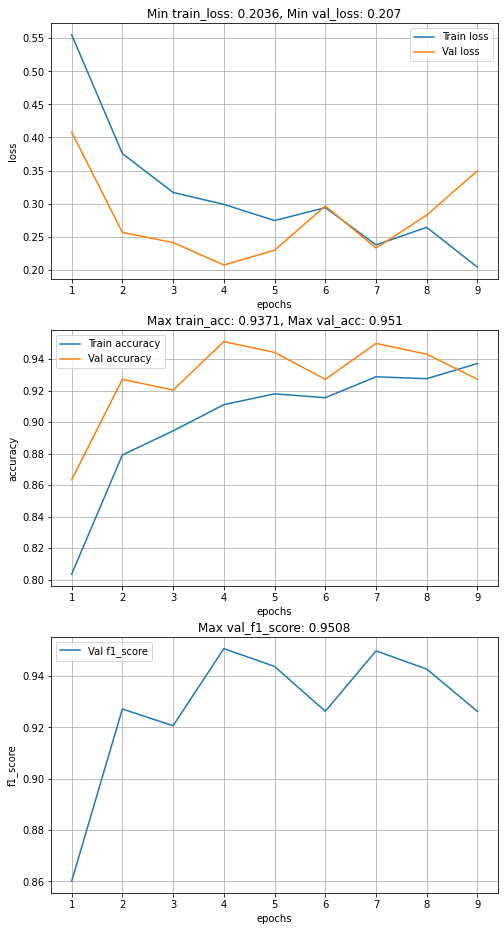

In [109]:
# evaluation metrics plot for model
plot_evaluation_metrics(efficientNet_history, name='EfficientNetB0 model')

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising confusion matrix on test data</p>

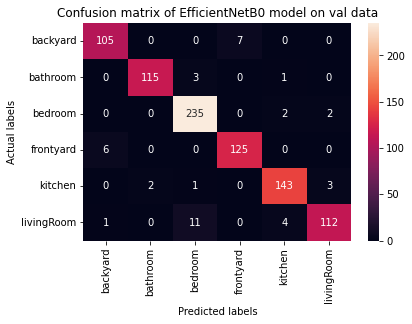

In [110]:
# ploting confusion matrix
plot_confusion_matrix(efficientNet_model, val_data_generator, name='EfficientNetB0 model')

* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising random images with actual and predicted labels</p>

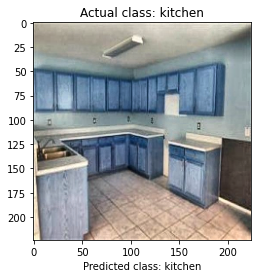



--------------------------------------------




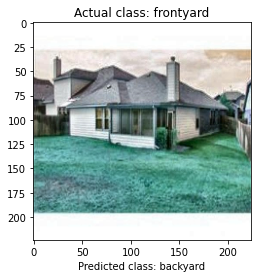



--------------------------------------------




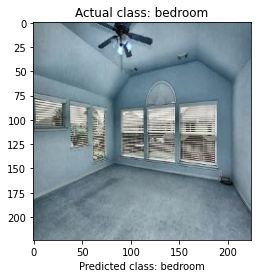



--------------------------------------------




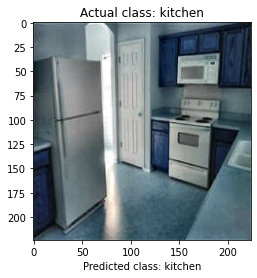



--------------------------------------------




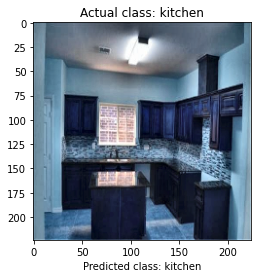



--------------------------------------------




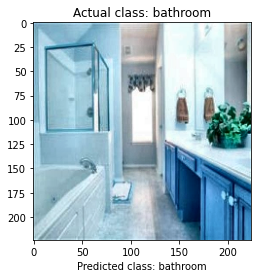



--------------------------------------------




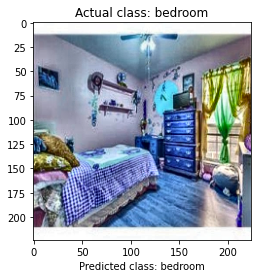



--------------------------------------------




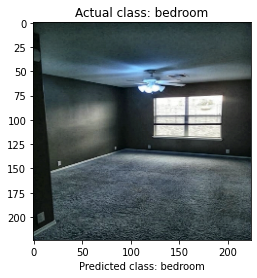



--------------------------------------------




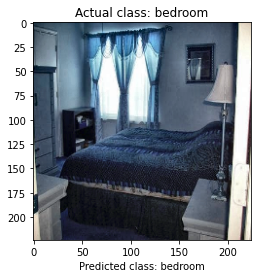



--------------------------------------------




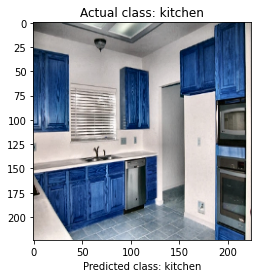



--------------------------------------------




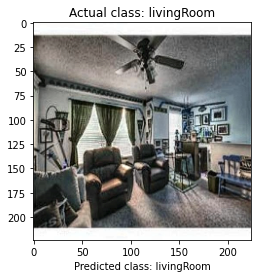



--------------------------------------------




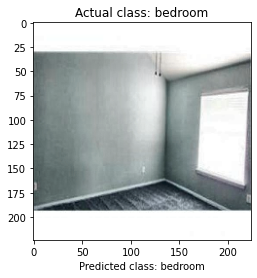



--------------------------------------------




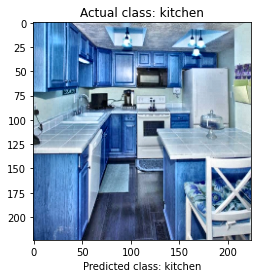



--------------------------------------------




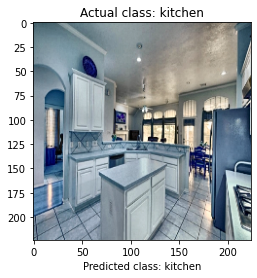



--------------------------------------------




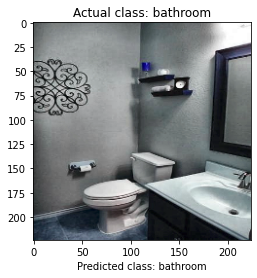



--------------------------------------------




In [111]:
# ploting 15-sample images with their actual and predicted labels
get_test_sample_predictions(efficientNet_model, preprocess_input, TARGET_SHAPE, sample=15)

In [112]:
# garbage collector
gc.collect()

161862

<p style="font-size:20px; font-style:italic; font-weight:bold">Observation</p>

<p style="font-size:14px; color:green; font-style:italic; ">From the above plot we can see that our EfficientNet-B0 based model performs better than all the models and achieves f1 and accuracy score of 95.08%, and it also performed well from both VGG16 based model.</p>

<p style="font-size:14px; color:green; font-style:italic; ">It is getting confused in differentiating between bedroom-livingroom, kitchen-livingroom, frontyard-backyard than the rest of classes. But the false predictions is lower than the all the earlier models.</p>
<p style="font-size:14px; color:green; font-style:italic; ">From the sample images plots we can see the confusion in prediction.</p>
<p style="font-size:14px; color:green; font-style:italic; "></p>
<p style="font-size:14px; color:green; font-style:italic; "></p>

<p style="font-size:20px; font-style:italic; font-weight:bold">11.&ensp;Summary of all the models</p>

* <p style="font-size:14px; color:blue; font-style:italic; ">storing f1_score and accuracy for all the models in variable to create a dataframe</p>

In [113]:
# Base model
base_model_f1_score = max(base_history['val_f1_score'])
idx = base_history['val_f1_score'].index(base_model_f1_score)
base_model_val_acc = base_history['val_accuracy'][idx]
# VGG16 model
vgg16_model_f1_score = max(vgg16_history['val_f1_score'])
idx = vgg16_history['val_f1_score'].index(vgg16_model_f1_score)
vgg16_model_val_acc = vgg16_history['val_accuracy'][idx]
# VGG19 model
vgg19_model_f1_score = max(vgg19_history['val_f1_score'])
idx = vgg19_history['val_f1_score'].index(vgg19_model_f1_score)
vgg19_model_val_acc = vgg19_history['val_accuracy'][idx]
# ResNet-50 model
resnet50_model_f1_score = max(resnet50_history['val_f1_score'])
idx = resnet50_history['val_f1_score'].index(resnet50_model_f1_score)
resnet50_model_val_acc = resnet50_history['val_accuracy'][idx]
# ResNet-152 model
resnet152_model_f1_score = max(resnet152_history['val_f1_score'])
idx = resnet152_history['val_f1_score'].index(resnet152_model_f1_score)
resnet152_model_val_acc = resnet152_history['val_accuracy'][idx]
# InceptionV3 model
inceptionV3_model_f1_score = max(inceptionv3_history['val_f1_score'])
idx = inceptionv3_history['val_f1_score'].index(inceptionV3_model_f1_score)
inceptionV3_model_val_acc = inceptionv3_history['val_accuracy'][idx]
# EfficientNet-B0 model
efficientNet_model_f1_score = max(efficientNet_history['val_f1_score'])
idx = efficientNet_history['val_f1_score'].index(efficientNet_model_f1_score)
efficientNet_model_val_acc = efficientNet_history['val_accuracy'][idx]

* <p style="font-size:14px; color:blue; font-style:italic; ">Creating dataframe of scores for all the models</p>

In [114]:
evaluation_metrics_score = np.array([[base_model_f1_score, base_model_val_acc],
                                     [vgg16_model_f1_score, vgg16_model_val_acc],
                                     [vgg19_model_f1_score, vgg19_model_val_acc],
                                     [resnet50_model_f1_score, resnet50_model_val_acc],
                                     [resnet152_model_f1_score, resnet152_model_val_acc],
                                     [inceptionV3_model_f1_score, inceptionV3_model_val_acc],
                                     [efficientNet_model_f1_score, efficientNet_model_val_acc]])
models_name = ['Baseline model',
               'VGG16 based model',
               'VGG19 based model',
               'ResNet50 based model',
               'ResNet152 based model',
               'InceptionV3 based model',
               'EfficientNet based model']

In [115]:
score = pd.DataFrame(data=evaluation_metrics_score, 
                     columns=['val_f1_score', 'val_accuracy'], 
                     index=models_name)

score

,val_f1_score,val_accuracy
Baseline model,0.783568,0.783565
VGG16 based model,0.921057,0.920872
VGG19 based model,0.921927,0.922374
ResNet50 based model,0.940235,0.940639
ResNet152 based model,0.929420,0.929465
InceptionV3 based model,0.877811,0.879271
EfficientNet based model,0.950755,0.951025


* <p style="font-size:14px; color:blue; font-style:italic; ">Visualising scores using seaborn heatmap</p>

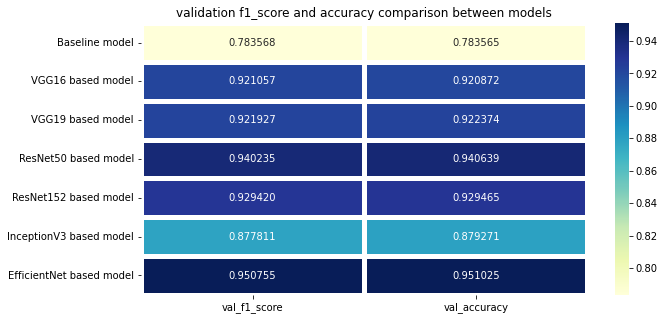

In [116]:
fig, ax = plt.subplots(figsize=(10,5))
ax = sns.heatmap(score, cmap="YlGnBu", annot=True, fmt='f', linecolor='white', linewidths=5)
ax.set_title('validation f1_score and accuracy comparison between models')
plt.show()

In [117]:
# garbage collector
gc.collect()

0

<p style="font-size:20px; font-style:italic; font-weight:bold">Observation</p>

<p style="font-size:14px; color:green; font-style:italic; ">From the above plot we can see that our efficientNet-B0 model performs best from all the other pretrained models including base model.</p>

<p style="font-size:14px; color:green; font-style:italic; ">Since, the images data are not that enough, thats why we seen false predictions in few classes. These may be handled correctly if data set is large and having similar number of images, not even a single class having more images than others. But yes all pretrained weights based models performed well on this dataset.</p>

<p style="font-size:14px; color:green; font-style:italic; ">All the models trained with the default parameters</p>
<p style="font-size:14px; color:green; font-style:italic; "></p>

<p style="font-size:20px; font-style:italic; font-weight:bold">12.&ensp;Saving vectorizers and the class list</p>
<p style="font-size:14px; color:green; font-style:italic; font-weight:bold">so that we can use it further for prediction</p>

In [118]:
# importing pickle module
import pickle as pkl

# saving one hot encoder vectorizer into disk
with open('ohe_vectorizer.pkl', 'wb') as f:
    pkl.dump(ohe, f)
    
# saving class_list contains labels into disk
with open('class_list.pkl', 'wb') as f:
    pkl.dump(class_list, f)

* <p style="font-size:14px; color:blue; font-style:italic; ">Due to time and hardware constraints I didn't tried other models</p>

<p style="font-size:14px; color:red; font-style:italic; ">&ensp;&ensp;&ensp;&ensp;------------------------------------ E N D ------------------------------------</p>